## Lane A_enriched from 4/2022
7/27/2023 - Data generated from Lentimix Library run 1 from 4/2022 with barcode enrichment
Run on 6 lanes, using Library2
Analyze global run on cellranger v6 data and create h5_ad files for further analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import math
import matplotlib

import anndata
from pathlib import Path

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/3482209352.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later
sc.settings.n_jobs=4

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.1.3 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


In [4]:
library = ["1660-Fosl2.752","1661-Fhl2.467","1663-Myc.989","1665-Yap1.735","1667-Atf4.1383","1671-Nfkb2.152",
           "1673-Relb.286","1676-Onecut2.2361","1811-Itga2.672","1999-Cldn4-951","2114-Lif.1890",
           "2115-Fosl1.1401","2118-Nfkb1.3737",'shRenilla']

In [5]:
tags = ["shRenilla_TGTCTAGT", "shRenilla_CATAGTCA", "shPatch_GTACTTGC", "shPatch_CCATTACT", 
        "1660-Fosl2.752_CGGGAATG", "1661-Fhl2.467_GCCTACGT", "1663-Myc.989_CTGAATCT",  "1665-Yap1.735_CGTTAGGG",
        "1667-Atf4.1383_TCTGGGGC", "1671-Nfkb2.152_CGTTCAAG", "1673-Relb.286_ACAGAGCC", 
        "1676-Onecut2.2361_TTAATTAG", "1811-Itga2.672_GCCAATCG", "1999-Cldn4-951_CGTTTCCT", 
        "2114-Lif.1890_ACACGTGA", "2115-Fosl1.1401_GGTAGGGA", "2118-Nfkb1.3737_CAGTGCAT"]

In [6]:
targetGenes = ['Fosl2', 'Fhl2', 'Myc', 'Yap1', 'Atf4', 'Nfkb2', 'Relb', 'Onecut2', 'Itga2', 'Cldn4', 'Lif', 'Fosl1', 'Nfkb1', 'Slc4a11', 'Tigit']

In [7]:
results_file = 'write/allmice_enriched.h5ad'  # the file that will store the analysis results

In [8]:
adata = sc.read_10x_h5('Lib1_LaneA_filtered_feature_bc_matrix.h5', gex_only=False)

reading Lib1_LaneA_filtered_feature_bc_matrix.h5
 (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
samples = list(adata[:,adata.var['feature_types']=='Antibody Capture'].var.index)

In [11]:
print(samples)

['AN1973_B0301', 'AO1374_B0302', 'AM1818_B0303', 'AM1153_B0304', 'AN1653_B0305', 'AN1640_B0306']


In [12]:
# Now filter out barcodes
hashadata = adata[:,samples]
adata = adata[:,[y for y in adata.var_names if y not in samples]]

In [13]:
hashadata.var

,gene_ids,feature_types,genome
AN1973_B0301,AN1973,Antibody Capture,
AO1374_B0302,AO1374,Antibody Capture,
AM1818_B0303,AM1818,Antibody Capture,
AM1153_B0304,AM1153,Antibody Capture,
AN1653_B0305,AN1653,Antibody Capture,
AN1640_B0306,AN1640,Antibody Capture,


## Preprocessing

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


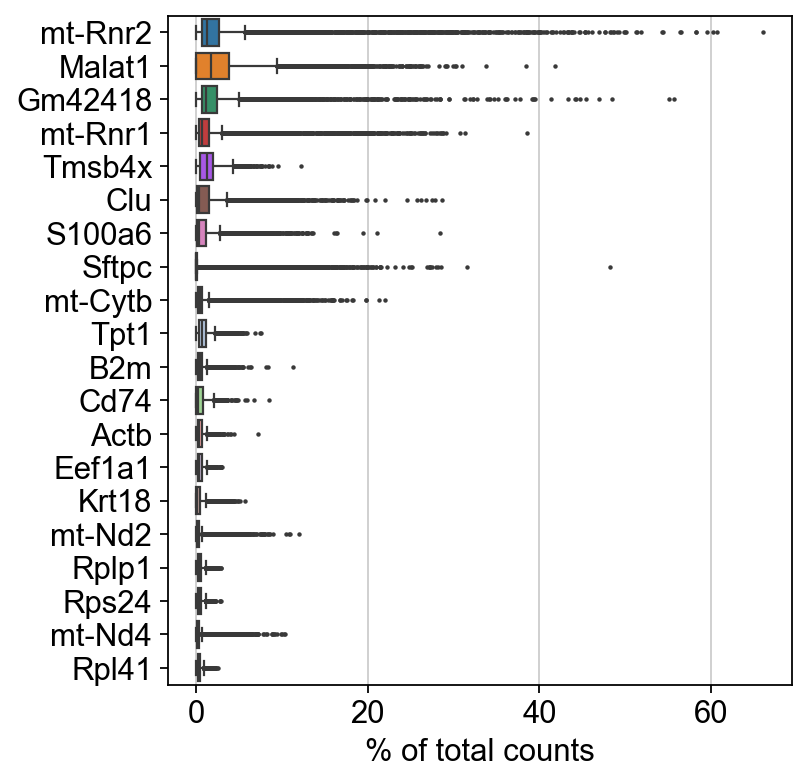

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [15]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)
#sc.pp.filter_cells(adata, min_counts=1500)

filtered out 346 cells that have less than 300 genes expressed
filtered out 29697 genes that are detected in less than 3 cells


In [16]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes as 'MT'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

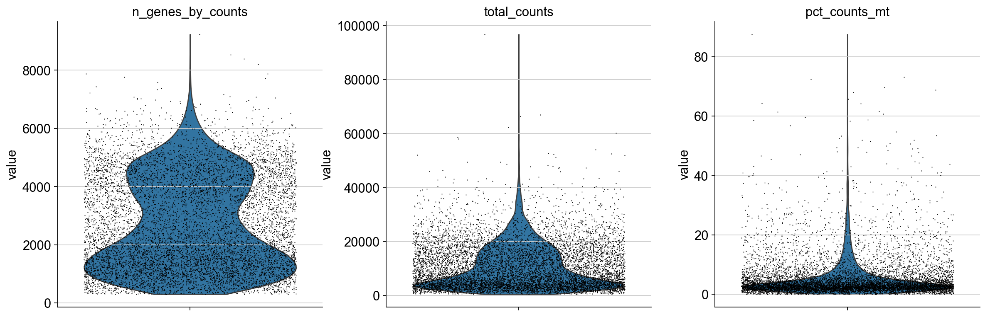

In [17]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

(array([  18.,   55.,  228.,  490.,  783., 1575., 3046., 2217.,  419.,
          29.]),
 array([0.6957469 , 0.7220911 , 0.74843529, 0.77477949, 0.80112368,
        0.82746788, 0.85381207, 0.88015627, 0.90650046, 0.93284466,
        0.95918886]),
 <BarContainer object of 10 artists>)

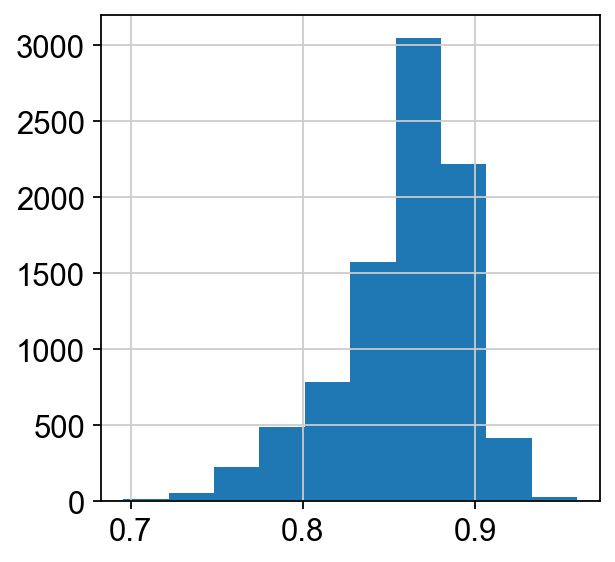

In [18]:
adata.obs["log10GenesPerUMI"] = adata.obs['n_genes_by_counts'].apply(math.log10) / adata.obs['total_counts'].apply(math.log10)
matplotlib.pyplot.hist(adata.obs["log10GenesPerUMI"])

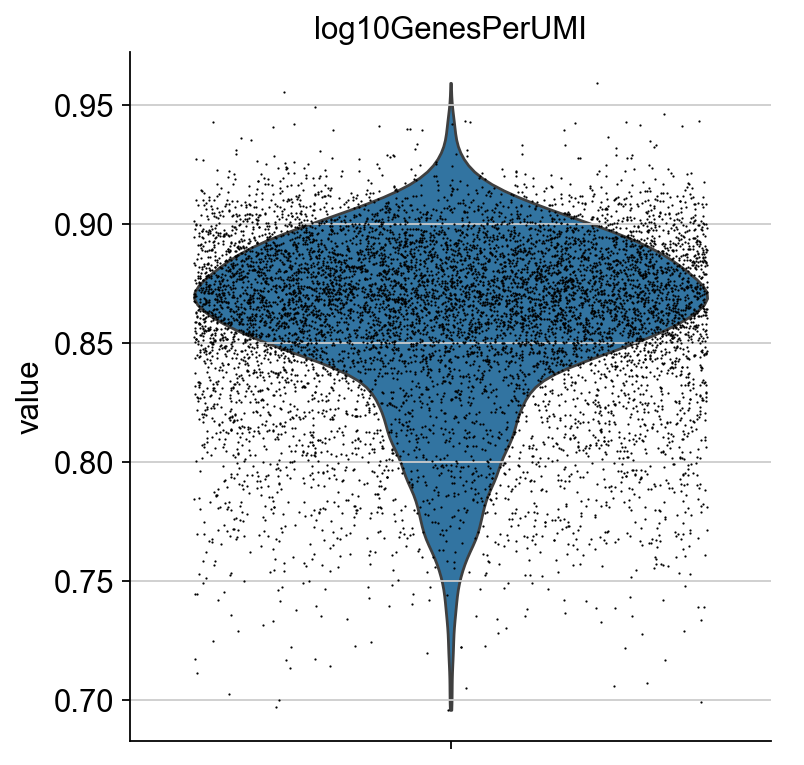

In [19]:
sc.pl.violin(adata, ['log10GenesPerUMI'],
             jitter=0.4, multi_panel=True, rotation=90)
#99% seems like a good Human pct count cutoff

Keep singlets, remove cells that have too many mouse reads, or mitochondrial genes expressed or too many total counts:

In [20]:
#Filter by Log10GenesPerUMI
adata = adata[adata.obs.log10GenesPerUMI >= 0.8,:]

In [21]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt <= 10, :]

## Run Demultiplexing

In [22]:
hashadata = hashadata[hashadata.obs.index.isin(adata.obs.index), :]

In [23]:
hashCounts = pd.DataFrame(hashadata.X.todense(), columns=hashadata.var_names, index=adata.obs.index)

In [24]:
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.99,0.999])
hashDisc

,AN1973_B0301,AO1374_B0302,AM1818_B0303,AM1153_B0304,AN1653_B0305,AN1640_B0306
count,7114.000000,7114.000000,7114.000000,7114.000000,7114.000000,7114.000000
mean,1148.136475,489.266388,599.626526,988.553528,125.986649,1166.127441
std,2106.193604,1956.465698,2282.648682,2703.750732,888.063782,3182.975098
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,7.000000,2.000000,4.000000,6.000000,0.000000,9.000000
20%,9.000000,4.000000,5.000000,8.000000,0.000000,11.000000
30%,11.000000,5.000000,6.000000,10.000000,0.000000,13.000000
40%,14.000000,5.000000,8.000000,11.000000,1.000000,16.000000
50%,17.000000,6.000000,9.000000,13.000000,1.000000,18.000000
60%,31.000000,8.000000,11.000000,16.000000,1.000000,21.000000


In [25]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
hashIDs

AN1973_B0301
4103.199999999999
AO1374_B0302
175.09999999999945
AM1818_B0303
988.1999999999989
AM1153_B0304
4245.499999999999
AN1653_B0305
4.0
AN1640_B0306
4759.5999999999985


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False  True  True ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False  True False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise 

,AN1973_B0301,AO1374_B0302,AM1818_B0303,AM1153_B0304,AN1653_B0305,AN1640_B0306
AAACCCAAGACTTCGT-1,False,False,True,False,False,False
AAACCCAAGGCGACAT-1,True,True,False,False,False,False
AAACCCAAGGGAGTTC-1,True,False,False,False,False,False
AAACCCACAAGCTCTA-1,False,False,False,False,True,False
AAACCCACAGAGTGAC-1,False,False,False,True,False,False
...,...,...,...,...,...,...
TTTGTTGGTGTTACAC-1,False,True,False,False,False,False
TTTGTTGTCAGGACAG-1,False,False,False,False,False,False
TTTGTTGTCCATCTAT-1,False,False,False,False,False,False
TTTGTTGTCGTTCTAT-1,False,False,False,False,False,False


In [26]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [27]:
from matplotlib import pyplot as plt

In [28]:
plt.rcParams['figure.figsize'] = (4,4)

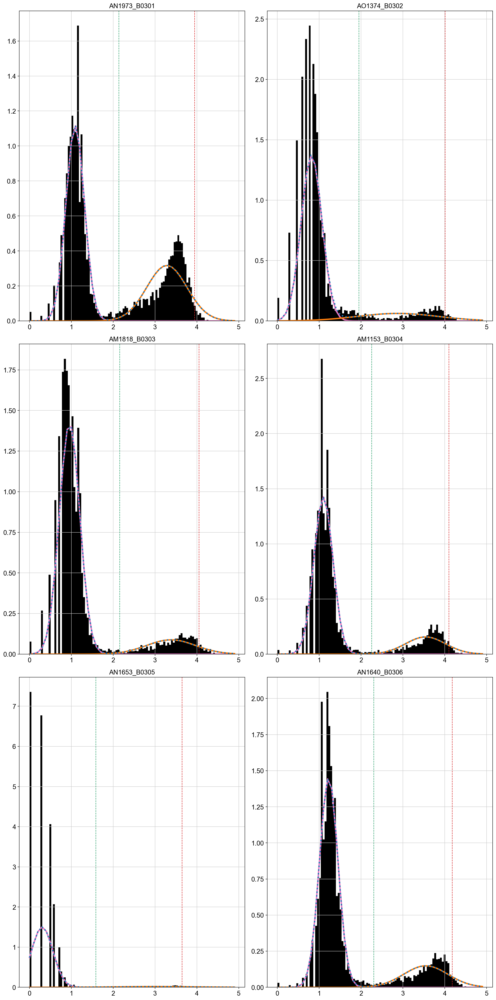

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

fig, axs = plt.subplots(3,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(hashadata.var_names)),hashadata.var_names, columns=["boundry"])
gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(hashadata.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
        else:
            #hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1 and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [30]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
AN1973_B0301,2.135
AO1374_B0302,1.950
AM1818_B0303,2.155
AM1153_B0304,2.255
AN1653_B0305,1.585
AN1640_B0306,2.305


In [31]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

AN1973_B0301
2.1350000000000002
AO1374_B0302
1.95
AM1818_B0303
2.1550000000000002
AM1153_B0304
2.255
AN1653_B0305
1.585
AN1640_B0306
2.305


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False  True  True ... False  True False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False  True False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/1750252066.py:6: FutureWarning: Setting an item of incomp

,AN1973_B0301,AO1374_B0302,AM1818_B0303,AM1153_B0304,AN1653_B0305,AN1640_B0306
AAACCCAAGACTTCGT-1,False,False,True,False,False,False
AAACCCAAGGCGACAT-1,True,True,False,False,False,False
AAACCCAAGGGAGTTC-1,True,False,False,False,False,False
AAACCCACAAGCTCTA-1,False,False,False,False,True,False
AAACCCACAGAGTGAC-1,False,False,False,True,False,False
...,...,...,...,...,...,...
TTTGTTGGTGTTACAC-1,False,True,False,False,False,False
TTTGTTGTCAGGACAG-1,True,False,False,False,False,False
TTTGTTGTCCATCTAT-1,False,False,False,False,False,False
TTTGTTGTCGTTCTAT-1,True,False,False,False,False,False


In [32]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [33]:
adata.obs["Classification"] = classification
hashadata.obs["Classification"] = classification
adata.obs["Classification"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/4135005838.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Classification"] = classification
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/4135005838.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  hashadata.obs["Classification"] = classification


Classification
AN1973_B0301    2317
AN1640_B0306    1137
AM1153_B0304    1077
AM1818_B0303     711
AO1374_B0302     658
doublet          518
negative         496
AN1653_B0305     200
Name: count, dtype: int64

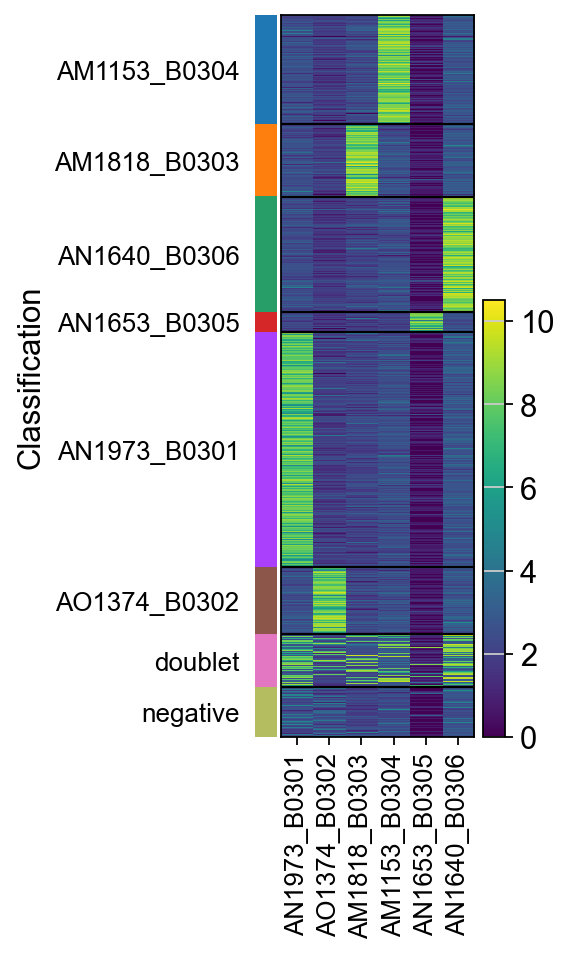

In [34]:
#output visulaization of hashing
sc.pl.heatmap(hashadata, hashadata.var_names, groupby="Classification", log=True)#, save = f"_{figName}_hash.png")

In [35]:
hashCounts = pd.DataFrame(index=adata.obs.index)

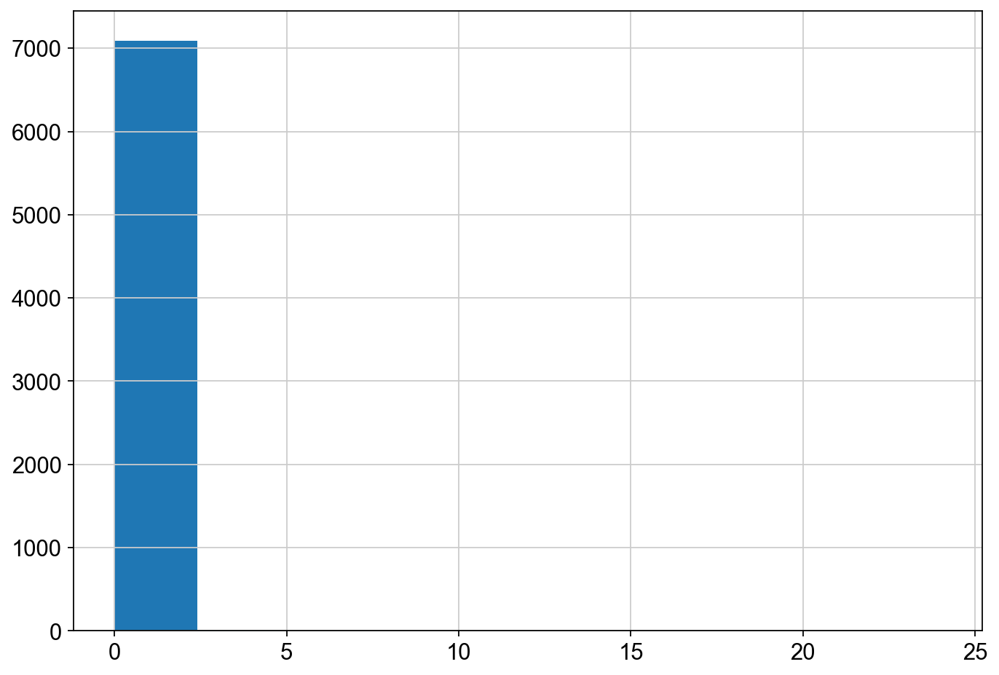

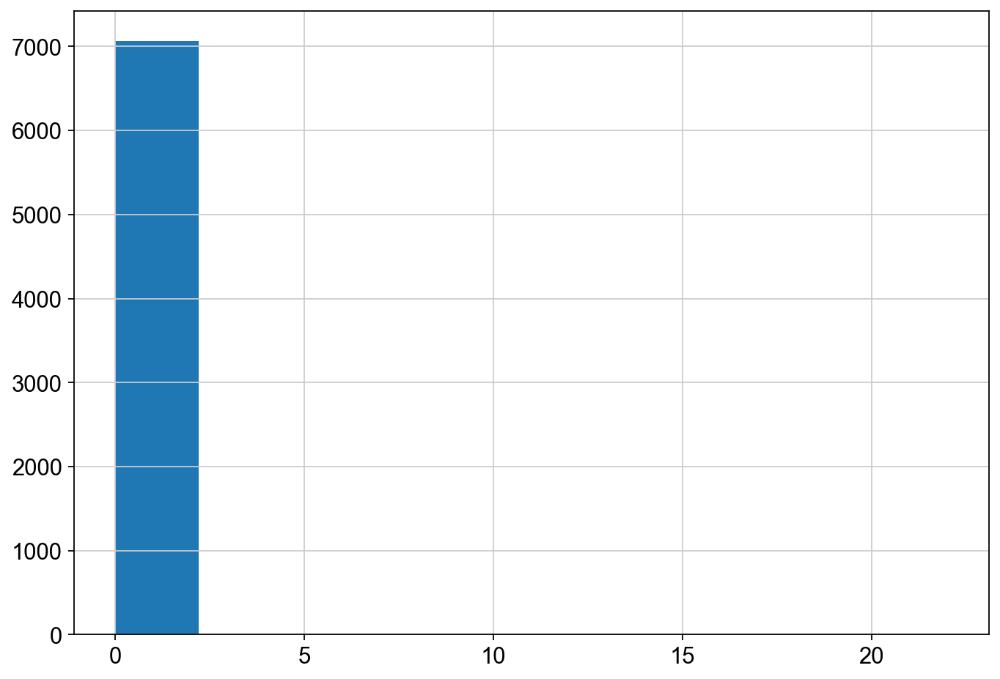

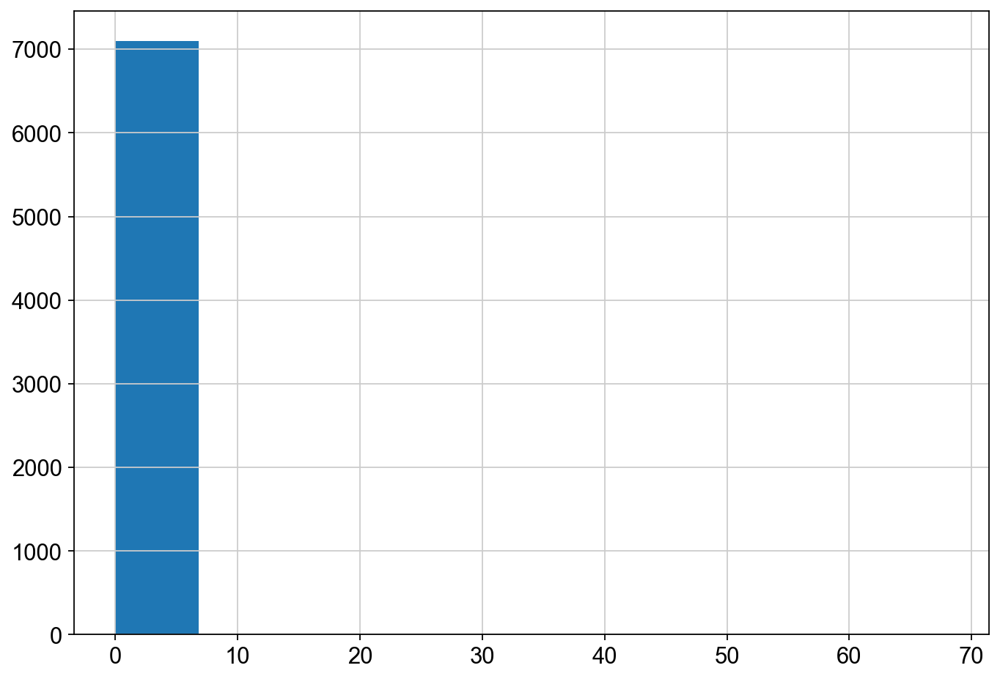

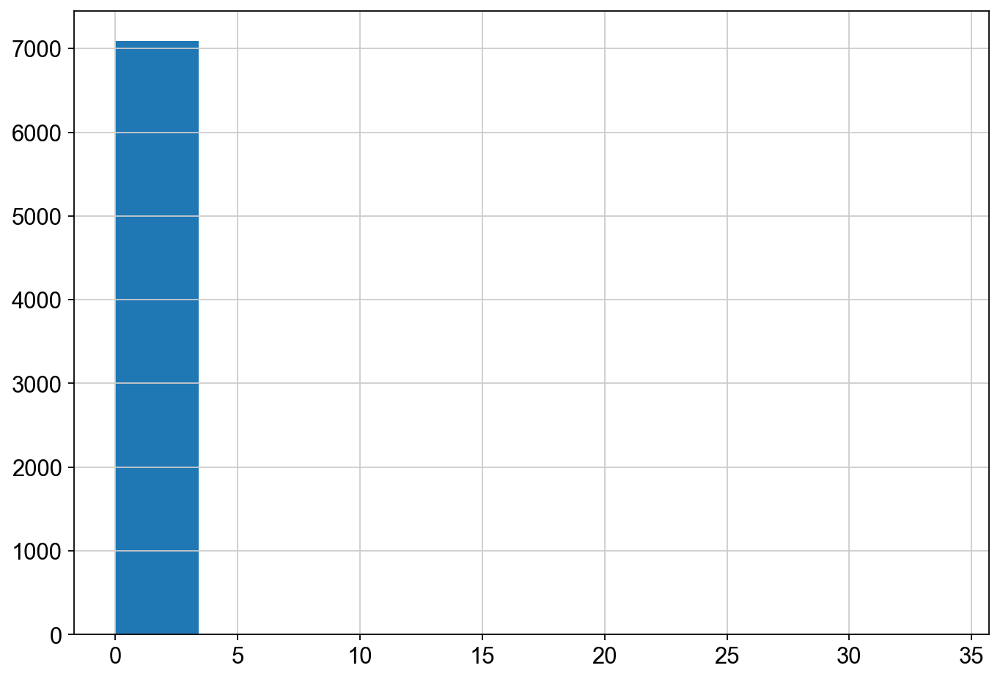

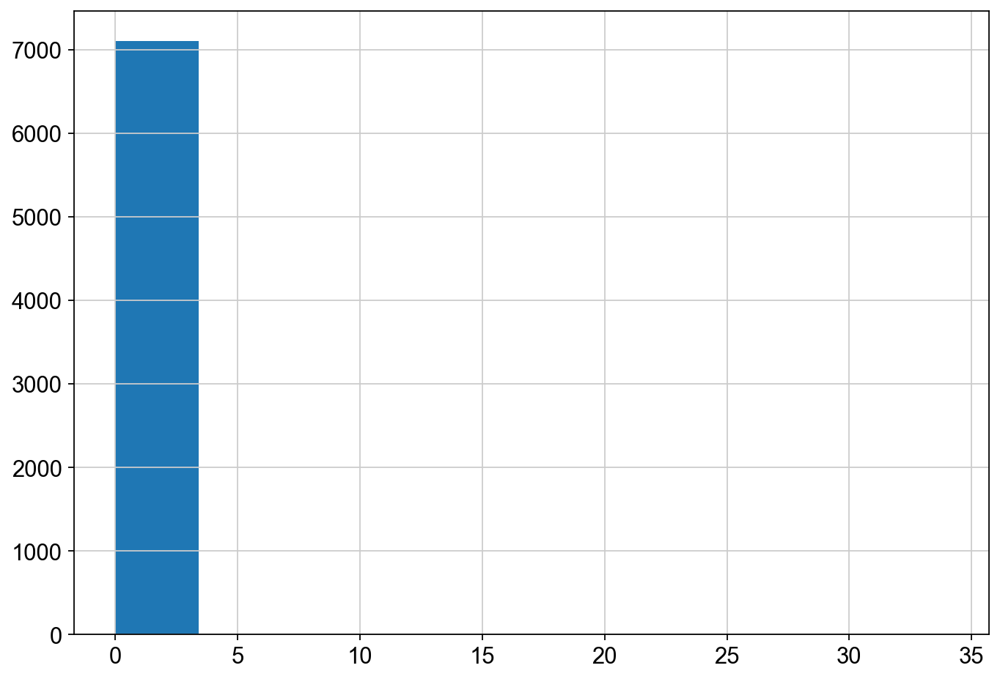

...

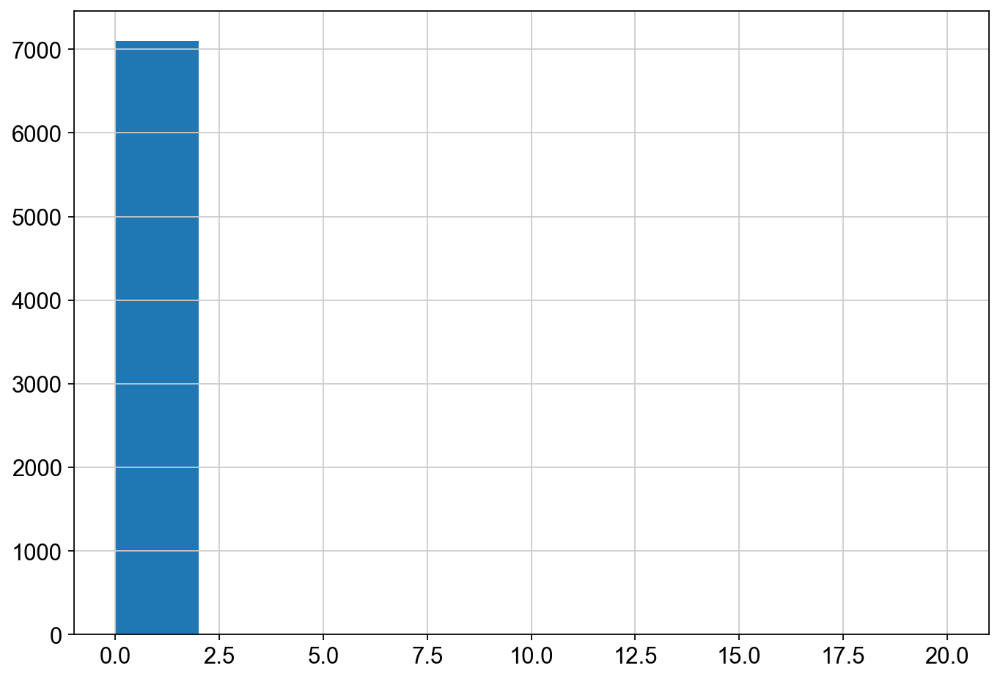

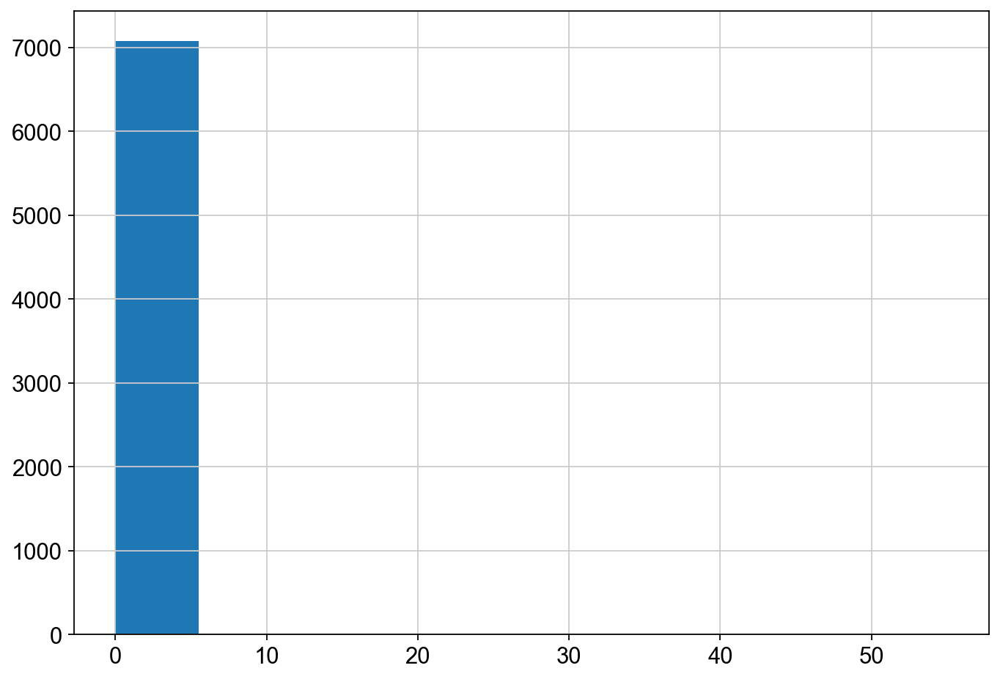

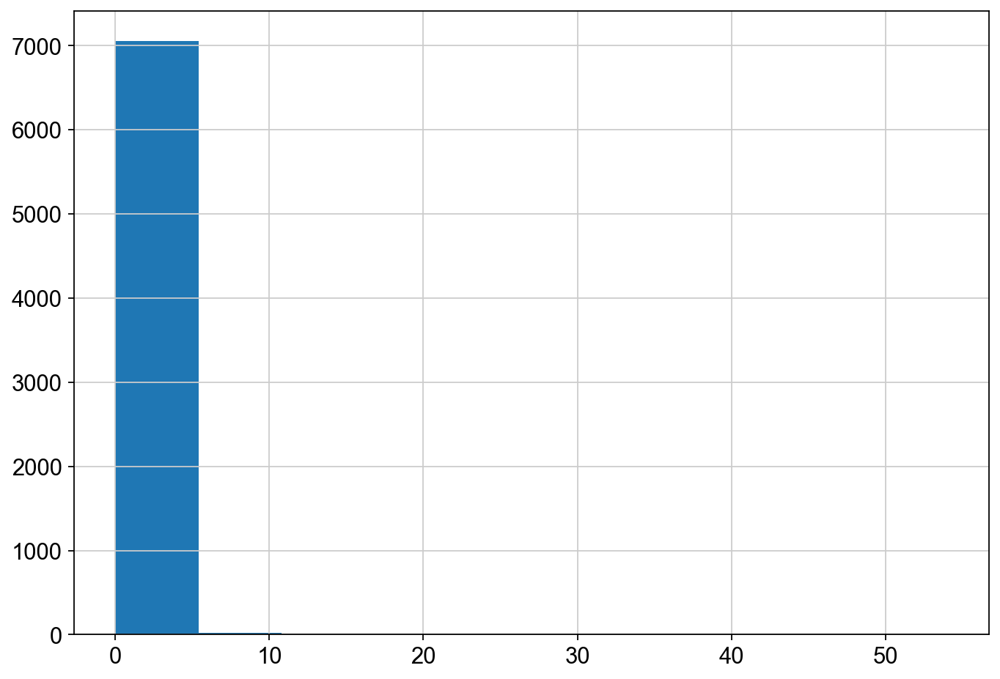

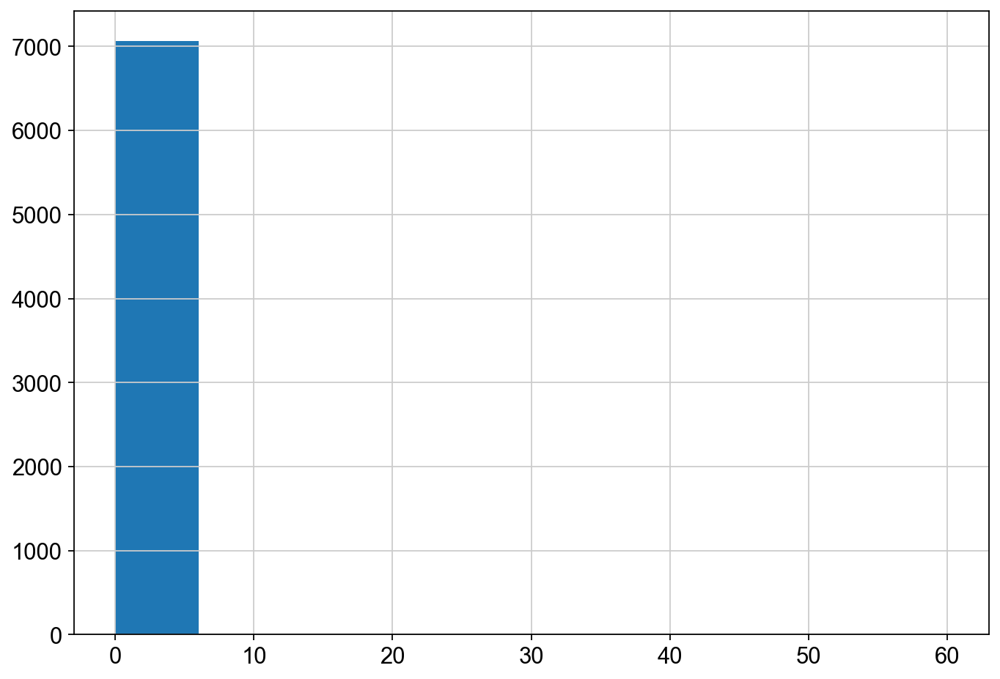

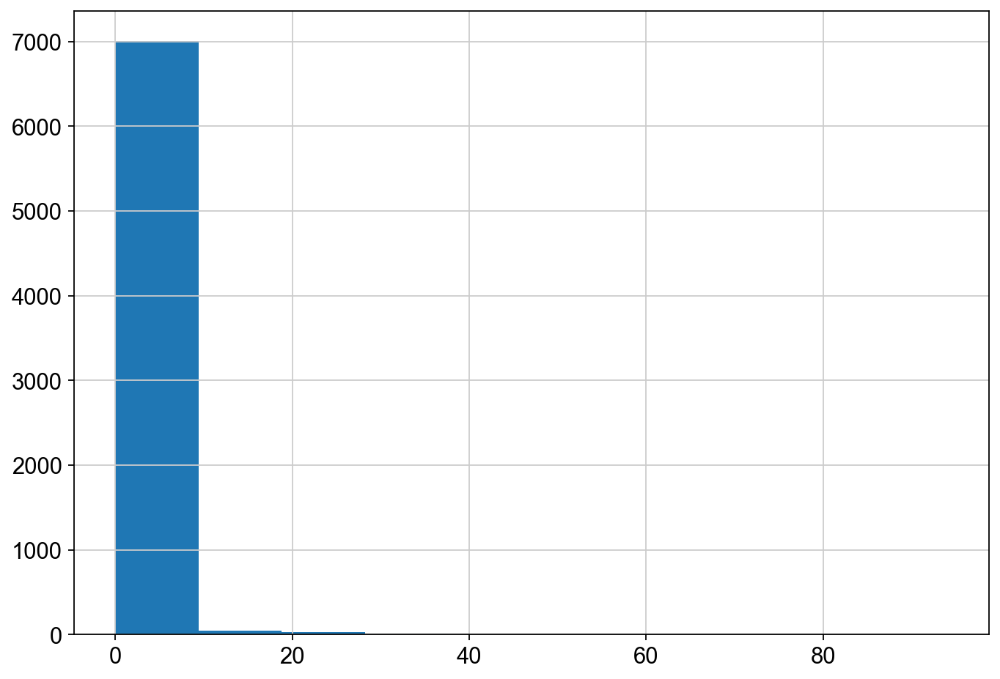

In [36]:
for x in library:
    fig, ax = plt.subplots(figsize =(10, 7))
    ax.hist(adata.X[:,adata.var.index.isin([x])].toarray())
    adata.obs["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
    hashCounts["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()

In [37]:
hashCounts

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGACTTCGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.0
AAACCCAAGGCGACAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0
AAACCCAAGGGAGTTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAAGCTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAGAGTGAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTGTTACAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCAGGACAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCCATCTAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCGTTCTAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


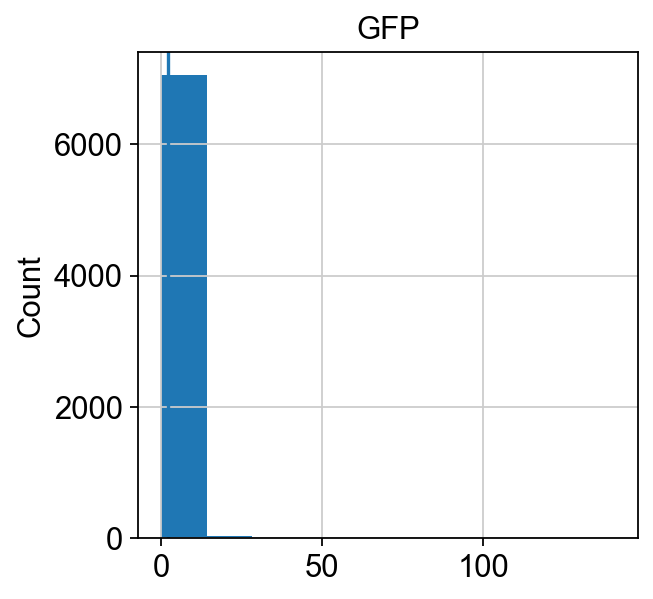

In [38]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'GFP'].X.toarray())
plt.ylabel("Count")
plt.title("GFP")
plt.axvline(x=2)
plt.show()

In [39]:
adata.obs['GFP_count'] = adata.X[:,adata.var.index.isin(['GFP'])].toarray()

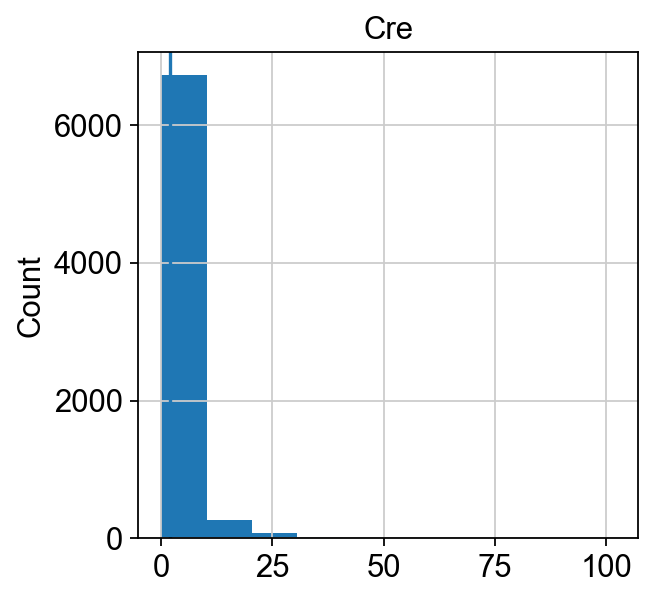

In [40]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'Cre'].X.toarray())
plt.ylabel("Count")
plt.title("Cre")
plt.axvline(x=2)
plt.show()

In [41]:
adata.obs['Cre_count'] = adata.X[:,adata.var.index.isin(['Cre'])].toarray()

## find single library read cells

In [42]:
hashIDs = hashCounts.copy()
for hashName in hashCounts.columns:
    print(hashName)
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

1660-Fosl2.752-library
1661-Fhl2.467-library
1663-Myc.989-library
1665-Yap1.735-library
1667-Atf4.1383-library
1671-Nfkb2.152-library
1673-Relb.286-library
1676-Onecut2.2361-library
1811-Itga2.672-library
1999-Cldn4-951-library
2114-Lif.1890-library
2115-Fosl1.1401-library
2118-Nfkb1.3737-library
shRenilla-library


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/379750047.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/379750047.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/379750047.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False 

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGACTTCGT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,True
AAACCCAAGGCGACAT-1,False,False,False,False,False,False,False,False,False,False,False,True,False,False
AAACCCAAGGGAGTTC-1,False,False,False,False,False,False,False,True,False,False,False,False,False,False
AAACCCACAAGCTCTA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAGAGTGAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTGTTACAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCAGGACAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCCATCTAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCGTTCTAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [43]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashCounts.columns[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [44]:
classification

array(['shRenilla-library', '2115-Fosl1.1401-library',
       '1676-Onecut2.2361-library', ..., 'negative', 'negative',
       'negative'], dtype=object)

In [45]:
adata.obs["library_id"] = classification
adata.obs["library_id"].value_counts()

library_id
negative                     6189
shRenilla-library             220
1676-Onecut2.2361-library     132
2115-Fosl1.1401-library        93
1673-Relb.286-library          91
2118-Nfkb1.3737-library        71
2114-Lif.1890-library          70
1671-Nfkb2.152-library         51
1661-Fhl2.467-library          50
1660-Fosl2.752-library         36
1665-Yap1.735-library          32
1663-Myc.989-library           30
1811-Itga2.672-library         22
1999-Cldn4-951-library         13
1667-Atf4.1383-library         11
doublet                         3
Name: count, dtype: int64

## Prune filtered cells and run hashing on extra hashtag reads

In [46]:
adata_enriched = sc.read_10x_h5('../barcodes/A/Lib1_A_BC_enriched_filtered_feature_bc_matrix.h5')

reading ../barcodes/A/Lib1_A_BC_enriched_filtered_feature_bc_matrix.h5
 (0:00:00)


In [47]:
adata_enriched

AnnData object with n_obs × n_vars = 4785 × 17
    var: 'gene_ids', 'feature_types', 'genome'

In [48]:
# Find the barcodes that exist in BOTH datasets
common_indices = adata_enriched.obs.index.intersection(adata.obs.index)

# Filter the enriched data to only include those common cells and the specific tags
adata_enriched = adata_enriched[common_indices, tags]

In [49]:
adata_enriched

View of AnnData object with n_obs × n_vars = 4495 × 17
    var: 'gene_ids', 'feature_types', 'genome'

In [50]:
hashCounts = pd.DataFrame(adata_enriched.X.todense(), columns=adata_enriched.var_names, index=adata_enriched.obs.index)

In [51]:
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGACTTCGT-1,417.0,0.0,44.0,71.0,71.0,50.0,54.0,17.0,8.0,61.0,54.0,144.0,28.0,8.0,58.0,61.0,51.0
AAACCCAAGGCGACAT-1,54.0,0.0,12.0,16.0,28.0,17.0,23.0,8.0,6.0,21.0,27.0,40.0,12.0,4.0,17.0,191.0,12.0
AAACCCAAGGGAGTTC-1,199.0,1.0,34.0,44.0,79.0,41.0,52.0,27.0,13.0,69.0,68.0,261.0,33.0,7.0,52.0,64.0,37.0
AAACCCACAAGCTCTA-1,165.0,0.0,10.0,12.0,19.0,10.0,11.0,4.0,3.0,6.0,20.0,22.0,6.0,1.0,15.0,21.0,9.0
AAACCCATCCCATAAG-1,142.0,1.0,23.0,23.0,55.0,31.0,29.0,17.0,11.0,42.0,50.0,87.0,20.0,3.0,48.0,33.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTATT-1,115.0,0.0,33.0,31.0,47.0,40.0,32.0,14.0,7.0,39.0,109.0,107.0,20.0,7.0,51.0,50.0,41.0
TTTGTTGGTCTACATG-1,99.0,0.0,20.0,29.0,46.0,29.0,32.0,16.0,9.0,34.0,51.0,63.0,19.0,4.0,42.0,41.0,22.0
TTTGTTGGTGTTACAC-1,65.0,0.0,7.0,11.0,25.0,17.0,17.0,6.0,1.0,14.0,35.0,35.0,9.0,5.0,15.0,17.0,16.0
TTTGTTGTCGTTCTAT-1,87.0,0.0,16.0,32.0,40.0,20.0,15.0,4.0,7.0,22.0,34.0,70.0,16.0,2.0,24.0,32.0,21.0


In [52]:
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.95,0.99,0.999])
hashDisc

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
count,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000,4495.000000
mean,103.936600,0.101224,22.110344,27.959955,44.264294,28.852947,27.187098,12.531257,5.628253,33.038265,40.318577,73.865402,15.363515,5.465406,32.327251,33.447163,24.815573
std,93.184212,0.336526,59.746681,44.483181,64.222008,50.114708,41.018059,20.643095,13.617852,44.383118,44.144516,77.353874,27.828876,15.459081,46.101295,43.578594,35.873405
min,15.000000,0.000000,2.000000,1.000000,5.000000,2.000000,2.000000,0.000000,0.000000,4.000000,6.000000,11.000000,0.000000,0.000000,3.000000,2.000000,1.000000
10%,43.000000,0.000000,8.000000,10.000000,18.000000,11.000000,10.000000,4.000000,1.000000,13.000000,16.000000,30.000000,5.000000,1.000000,12.000000,13.000000,9.000000
20%,53.000000,0.000000,10.000000,13.000000,22.000000,14.000000,13.000000,6.000000,2.000000,16.000000,20.000000,37.000000,7.000000,2.000000,16.000000,16.000000,12.000000
30%,62.000000,0.000000,12.000000,16.000000,26.000000,17.000000,15.000000,7.000000,3.000000,19.000000,24.000000,44.000000,9.000000,3.000000,19.000000,19.000000,14.000000
40%,74.000000,0.000000,15.000000,19.000000,31.000000,20.000000,18.000000,8.000000,4.000000,23.000000,28.000000,51.000000,10.000000,3.000000,22.000000,23.000000,17.000000
50%,86.000000,0.000000,17.000000,22.000000,35.000000,23.000000,21.000000,10.000000,4.000000,26.000000,33.000000,59.000000,12.000000,4.000000,25.000000,26.000000,19.000000
60%,98.000000,0.000000,20.000000,25.000000,41.000000,26.000000,24.000000,11.000000,5.000000,30.000000,38.000000,68.000000,14.000000,5.000000,29.000000,30.000000,22.000000


In [53]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
hashIDs

shRenilla_TGTCTAGT
164.0
shRenilla_CATAGTCA
0.0
shPatch_GTACTTGC
33.0
shPatch_CCATTACT
42.0
1660-Fosl2.752_CGGGAATG
68.0
1661-Fhl2.467_GCCTACGT
44.0
1663-Myc.989_CTGAATCT
41.0
1665-Yap1.735_CGTTAGGG
20.0
1667-Atf4.1383_TCTGGGGC
9.0
1671-Nfkb2.152_CGTTCAAG
50.0
1673-Relb.286_ACAGAGCC
62.0
1676-Onecut2.2361_TTAATTAG
113.59999999999991
1811-Itga2.672_GCCAATCG
24.0
1999-Cldn4-951_CGTTTCCT
9.0
2114-Lif.1890_ACACGTGA
49.0
2115-Fosl1.1401_GGTAGGGA
51.0
2118-Nfkb1.3737_CAGTGCAT
38.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2164788114.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False  True ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2164788114.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False  True ... False False  True]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2164788114.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise 

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGACTTCGT-1,True,False,True,True,True,True,True,False,False,True,False,True,True,False,True,True,True
AAACCCAAGGCGACAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
AAACCCAAGGGAGTTC-1,True,True,True,True,True,False,True,True,True,True,True,True,True,False,True,True,False
AAACCCACAAGCTCTA-1,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCCCATAAG-1,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTATT-1,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,True
TTTGTTGGTCTACATG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTGTTACAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCGTTCTAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [54]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [55]:
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGACTTCGT-1,417.0,0.0,44.0,71.0,71.0,50.0,54.0,17.0,8.0,61.0,54.0,144.0,28.0,8.0,58.0,61.0,51.0
AAACCCAAGGCGACAT-1,54.0,0.0,12.0,16.0,28.0,17.0,23.0,8.0,6.0,21.0,27.0,40.0,12.0,4.0,17.0,191.0,12.0
AAACCCAAGGGAGTTC-1,199.0,1.0,34.0,44.0,79.0,41.0,52.0,27.0,13.0,69.0,68.0,261.0,33.0,7.0,52.0,64.0,37.0
AAACCCACAAGCTCTA-1,165.0,0.0,10.0,12.0,19.0,10.0,11.0,4.0,3.0,6.0,20.0,22.0,6.0,1.0,15.0,21.0,9.0
AAACCCATCCCATAAG-1,142.0,1.0,23.0,23.0,55.0,31.0,29.0,17.0,11.0,42.0,50.0,87.0,20.0,3.0,48.0,33.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTATT-1,115.0,0.0,33.0,31.0,47.0,40.0,32.0,14.0,7.0,39.0,109.0,107.0,20.0,7.0,51.0,50.0,41.0
TTTGTTGGTCTACATG-1,99.0,0.0,20.0,29.0,46.0,29.0,32.0,16.0,9.0,34.0,51.0,63.0,19.0,4.0,42.0,41.0,22.0
TTTGTTGGTGTTACAC-1,65.0,0.0,7.0,11.0,25.0,17.0,17.0,6.0,1.0,14.0,35.0,35.0,9.0,5.0,15.0,17.0,16.0
TTTGTTGTCGTTCTAT-1,87.0,0.0,16.0,32.0,40.0,20.0,15.0,4.0,7.0,22.0,34.0,70.0,16.0,2.0,24.0,32.0,21.0


In [56]:
plt.rcParams['figure.figsize'] = (4,4)

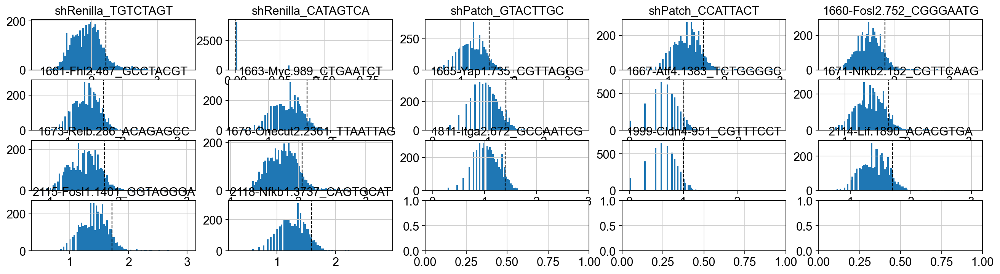

In [57]:
fig, axs = plt.subplots(4,5, figsize =(20, 5))

for i, hashName in enumerate(adata_enriched.var_names):
    hashCounts2 = np.log10(hashCounts[hashName]+1)
    axs[i//5,i%5].set_title(hashName)
    axs[i//5,i%5].hist(hashCounts2, bins = 100)
    axs[i//5,i%5].axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)

#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

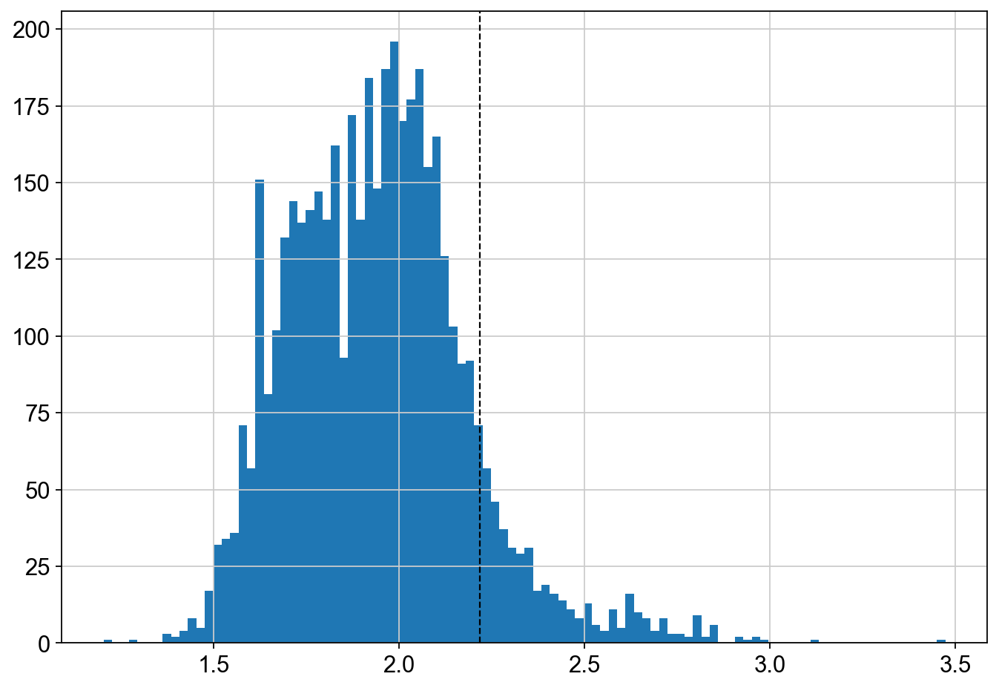

In [58]:
hashName= "shRenilla_TGTCTAGT"
hash301 = np.log10(hashCounts[hashName]+1)

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(hash301, bins = 100)
ax.axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)
# Show plot
plt.show()

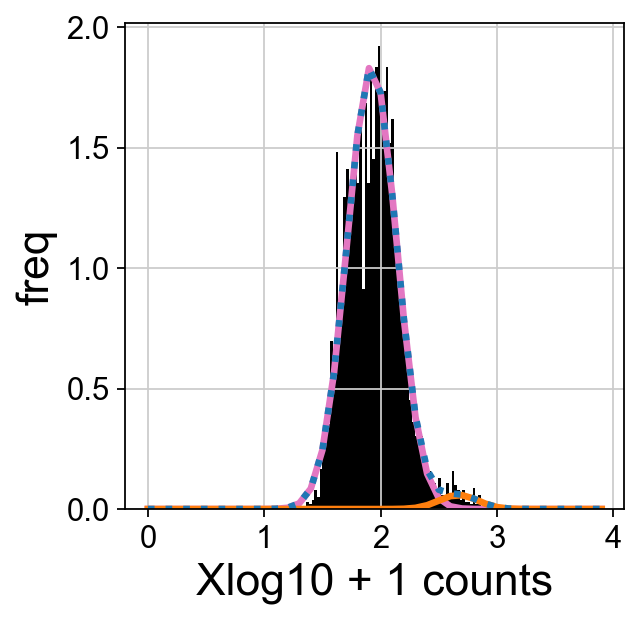

In [59]:
# import libraries (some are for cosmetics)
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

x = np.array(hash301).reshape(-1, 1)

# create GMM model object
gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])

# find useful parameters
fitGMM = gmm.fit(x)
mean = fitGMM.means_  
covs  = fitGMM.covariances_
weights = fitGMM.weights_

# create necessary things to plot
x_axis = np.arange(0, 4, 0.1)
y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

ax = fig.add_subplot(1,2,2)
# Plot 2
plt.hist(x, density=True, color='black', bins=100)
plt.plot(x_axis, y_axis0, lw=3, c='C6')
plt.plot(x_axis, y_axis1, lw=3, c='C1')
plt.plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')
#plt.xlim(0, 4, 0.1)
#plt.ylim(0.0, 2.0)
plt.xlabel(r"Xlog10 + 1 counts", fontsize=20)
plt.ylabel(r"freq", fontsize=20)

#plt.subplots_adjust(wspace=0.3)
plt.show()
plt.close('all')

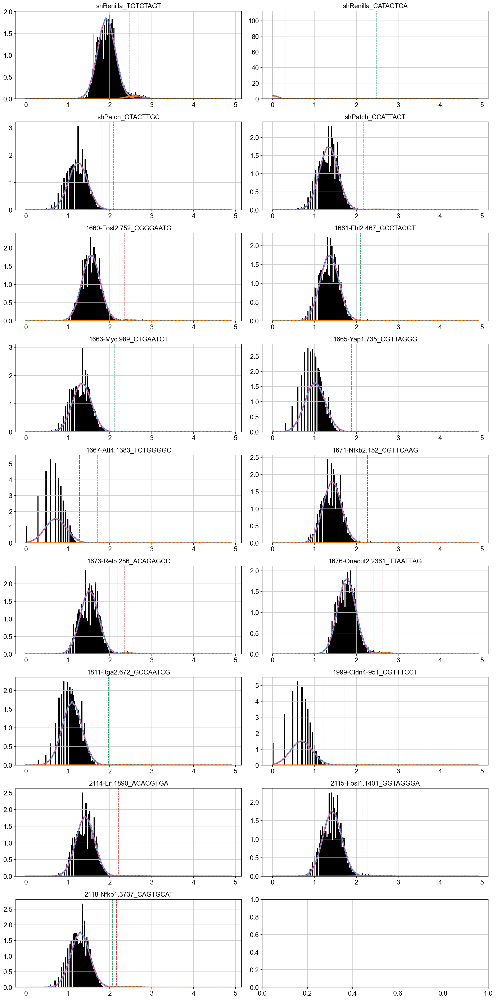

In [60]:
import pdb

fig, axs = plt.subplots(9,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(adata_enriched.var_names)),adata_enriched.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(adata_enriched.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[2],[3]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["95%",hashName])+1)
        else:
            hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1:# and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
#    hashBoundry = mean[0][0]+1.96*np.sqrt(float(covs[0][0][0]))
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [61]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
shRenilla_TGTCTAGT,2.475
shRenilla_CATAGTCA,2.475
shPatch_GTACTTGC,2.090
shPatch_CCATTACT,2.110
1660-Fosl2.752_CGGGAATG,2.240
1661-Fhl2.467_GCCTACGT,2.095
1663-Myc.989_CTGAATCT,2.105
1665-Yap1.735_CGTTAGGG,1.880
1667-Atf4.1383_TCTGGGGC,1.705
1671-Nfkb2.152_CGTTCAAG,2.135


In [62]:
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGACTTCGT-1,417.0,0.0,44.0,71.0,71.0,50.0,54.0,17.0,8.0,61.0,54.0,144.0,28.0,8.0,58.0,61.0,51.0
AAACCCAAGGCGACAT-1,54.0,0.0,12.0,16.0,28.0,17.0,23.0,8.0,6.0,21.0,27.0,40.0,12.0,4.0,17.0,191.0,12.0
AAACCCAAGGGAGTTC-1,199.0,1.0,34.0,44.0,79.0,41.0,52.0,27.0,13.0,69.0,68.0,261.0,33.0,7.0,52.0,64.0,37.0
AAACCCACAAGCTCTA-1,165.0,0.0,10.0,12.0,19.0,10.0,11.0,4.0,3.0,6.0,20.0,22.0,6.0,1.0,15.0,21.0,9.0
AAACCCATCCCATAAG-1,142.0,1.0,23.0,23.0,55.0,31.0,29.0,17.0,11.0,42.0,50.0,87.0,20.0,3.0,48.0,33.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTATT-1,115.0,0.0,33.0,31.0,47.0,40.0,32.0,14.0,7.0,39.0,109.0,107.0,20.0,7.0,51.0,50.0,41.0
TTTGTTGGTCTACATG-1,99.0,0.0,20.0,29.0,46.0,29.0,32.0,16.0,9.0,34.0,51.0,63.0,19.0,4.0,42.0,41.0,22.0
TTTGTTGGTGTTACAC-1,65.0,0.0,7.0,11.0,25.0,17.0,17.0,6.0,1.0,14.0,35.0,35.0,9.0,5.0,15.0,17.0,16.0
TTTGTTGTCGTTCTAT-1,87.0,0.0,16.0,32.0,40.0,20.0,15.0,4.0,7.0,22.0,34.0,70.0,16.0,2.0,24.0,32.0,21.0


In [63]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

shRenilla_TGTCTAGT
2.475
shRenilla_CATAGTCA
2.475
shPatch_GTACTTGC
2.09
shPatch_CCATTACT
2.11
1660-Fosl2.752_CGGGAATG
2.24
1661-Fhl2.467_GCCTACGT
2.095
1663-Myc.989_CTGAATCT
2.105
1665-Yap1.735_CGTTAGGG
1.8800000000000001
1667-Atf4.1383_TCTGGGGC
1.705
1671-Nfkb2.152_CGTTCAAG
2.1350000000000002
1673-Relb.286_ACAGAGCC
2.19
1676-Onecut2.2361_TTAATTAG
2.4
1811-Itga2.672_GCCAATCG
1.97
1999-Cldn4-951_CGTTTCCT
1.71
2114-Lif.1890_ACACGTGA
2.15
2115-Fosl1.1401_GGTAGGGA
2.1350000000000002
2118-Nfkb1.3737_CAGTGCAT
2.065


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/1438516903.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/1438516903.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/1438516903.py:6: FutureWarning: Setting an item of incomp

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGACTTCGT-1,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAAGGCGACAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
AAACCCAAGGGAGTTC-1,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False
AAACCCACAAGCTCTA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCCCATAAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATCCTATT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTCTACATG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTGTTACAC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCGTTCTAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [64]:
classification = np.empty(len(adata_enriched), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [65]:
adata_enriched

View of AnnData object with n_obs × n_vars = 4495 × 17
    var: 'gene_ids', 'feature_types', 'genome'

In [66]:
adata_enriched.obs['Library'] = classification
adata.obs["Library"] = adata_enriched.obs['Library']
adata.obs["Library"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2727749959.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_enriched.obs['Library'] = classification


Library
negative                      3781
shRenilla_TGTCTAGT             106
1676-Onecut2.2361_TTAATTAG      77
1673-Relb.286_ACAGAGCC          62
2115-Fosl1.1401_GGTAGGGA        51
1660-Fosl2.752_CGGGAATG         49
2118-Nfkb1.3737_CAGTGCAT        46
1671-Nfkb2.152_CGTTCAAG         46
2114-Lif.1890_ACACGTGA          43
1661-Fhl2.467_GCCTACGT          41
shPatch_CCATTACT                40
1663-Myc.989_CTGAATCT           40
1665-Yap1.735_CGTTAGGG          29
1811-Itga2.672_GCCAATCG         23
doublet                         23
shPatch_GTACTTGC                16
1999-Cldn4-951_CGTTTCCT         11
1667-Atf4.1383_TCTGGGGC         11
Name: count, dtype: int64

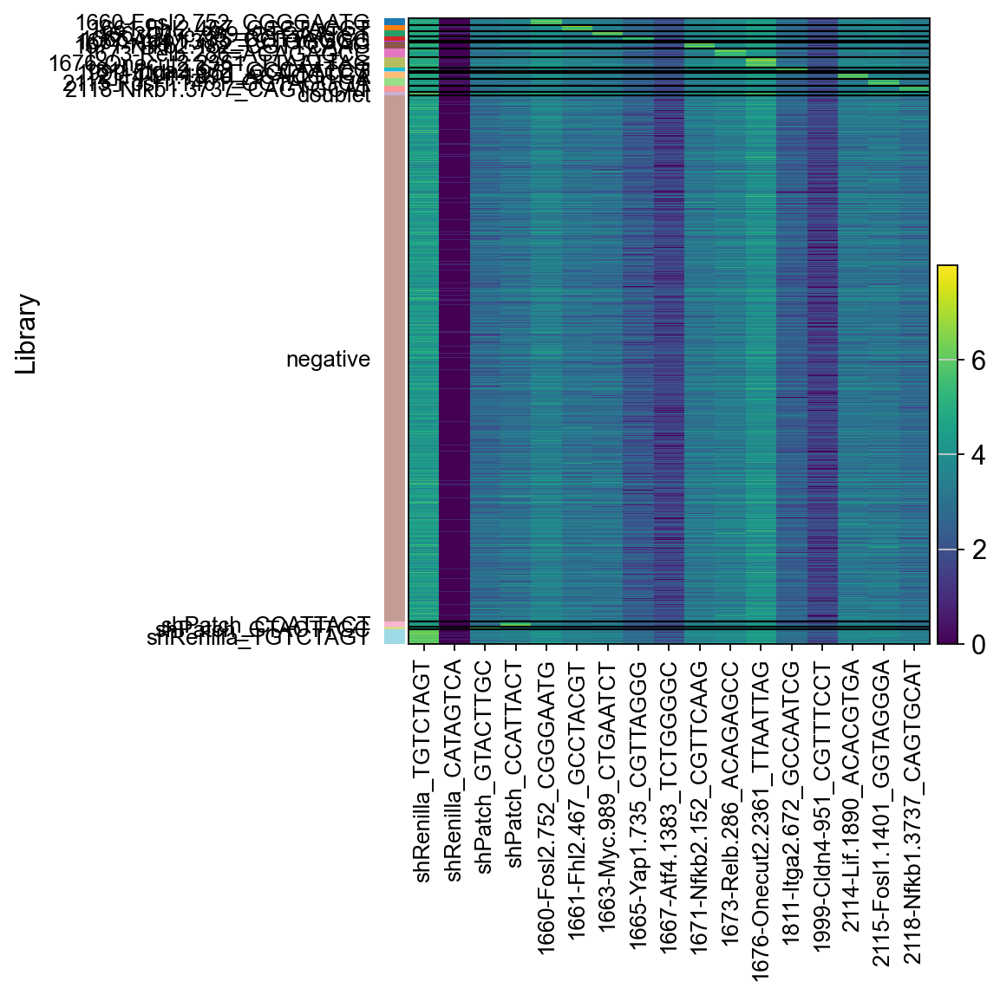

In [67]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched, adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

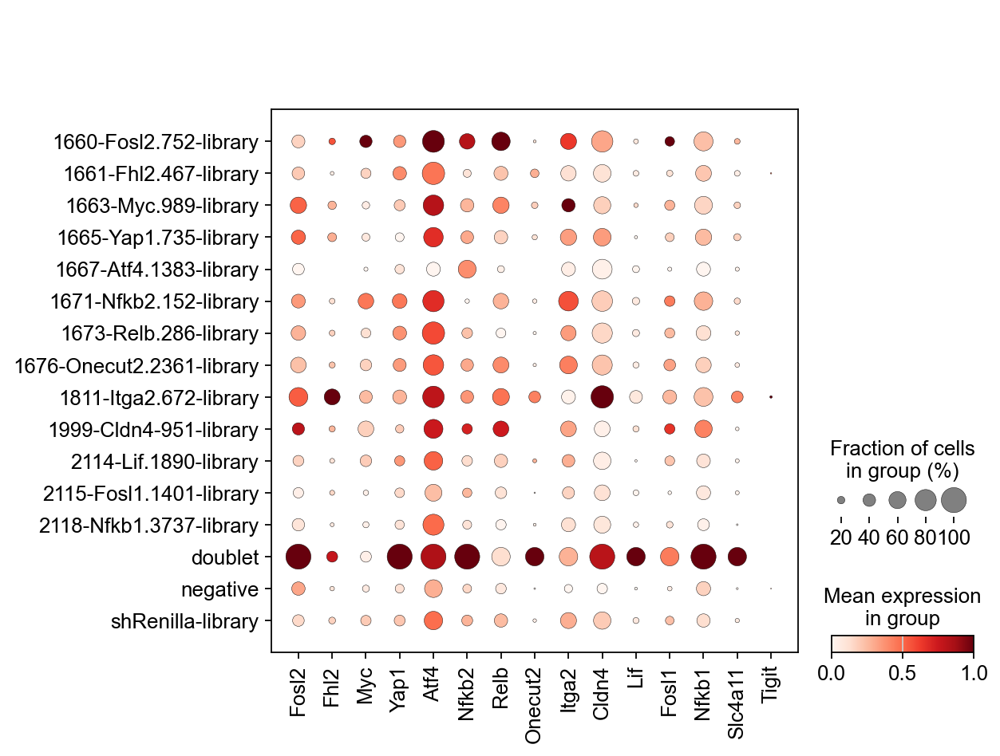

In [68]:
sc.pl.dotplot(adata, targetGenes, groupby='library_id', standard_scale='var')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

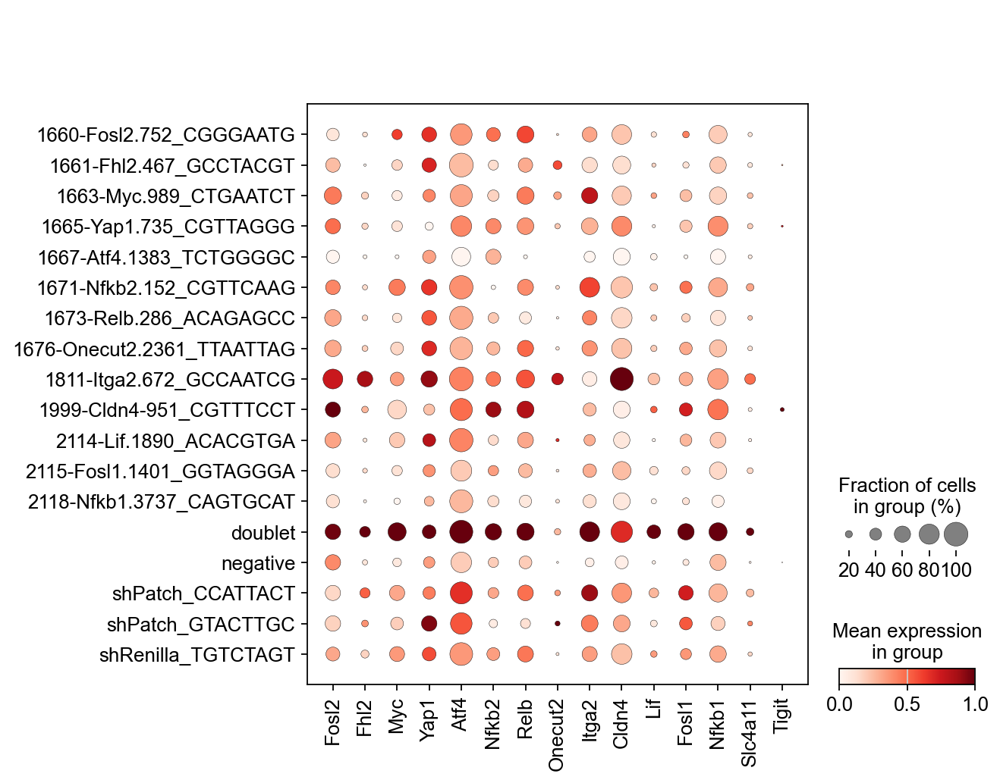

In [69]:
sc.pl.dotplot(adata, targetGenes, groupby='Library', standard_scale='var')

In [70]:
adata.obs.Library.value_counts()

Library
negative                      3781
shRenilla_TGTCTAGT             106
1676-Onecut2.2361_TTAATTAG      77
1673-Relb.286_ACAGAGCC          62
2115-Fosl1.1401_GGTAGGGA        51
1660-Fosl2.752_CGGGAATG         49
1671-Nfkb2.152_CGTTCAAG         46
2118-Nfkb1.3737_CAGTGCAT        46
2114-Lif.1890_ACACGTGA          43
1661-Fhl2.467_GCCTACGT          41
1663-Myc.989_CTGAATCT           40
shPatch_CCATTACT                40
1665-Yap1.735_CGTTAGGG          29
1811-Itga2.672_GCCAATCG         23
doublet                         23
shPatch_GTACTTGC                16
1999-Cldn4-951_CGTTTCCT         11
1667-Atf4.1383_TCTGGGGC         11
Name: count, dtype: int64

In [71]:
adata.obs.library_id.value_counts()

library_id
negative                     6189
shRenilla-library             220
1676-Onecut2.2361-library     132
2115-Fosl1.1401-library        93
1673-Relb.286-library          91
2118-Nfkb1.3737-library        71
2114-Lif.1890-library          70
1671-Nfkb2.152-library         51
1661-Fhl2.467-library          50
1660-Fosl2.752-library         36
1665-Yap1.735-library          32
1663-Myc.989-library           30
1811-Itga2.672-library         22
1999-Cldn4-951-library         13
1667-Atf4.1383-library         11
doublet                         3
Name: count, dtype: int64

In [72]:
import re
m = re.compile("(.+\-|negative|doublet)")

In [73]:
i=0
for x, y in adata.obs[['library_id', 'Library']].iterrows():
    print(y)
    i+=1
    if i == 1: 
        library_id,Library = y
        print(library_id[:-8])
        break

library_id     shRenilla-library
Library       shRenilla_TGTCTAGT
Name: AAACCCAAGACTTCGT-1, dtype: object
shRenilla


In [74]:
classification = np.empty(len(adata), dtype="object")
i=0
import re
m1 = re.compile("(.+\-library|negative|doublet)")
m2 = re.compile("(.+\_)|negative|doublet")
for x,y in adata.obs[['library_id', 'Library']].iterrows():
    library_id,Library = y
    m1match = m1.match(library_id)
    if pd.isna(Library): 
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        classification[i] = m1match
    elif m1.match(library_id) and m2.match(Library):
        m2match = m2.match(Library)
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        if m2match.group(0)[-1] == "_":
            m2match = m2match.group(0)[:-1]
        else:
            m2match = m2match.group(0)
        if m1match == m2match:
            classification[i] = m1match
        elif m1match == 'doublet' or m2match == 'doublet':
            classification[i] = 'doublet'
        elif m1match == 'negative':
            classification[i] = m2match
        elif m2match == 'negative':
            classification[i] = m1match
        else:
            classification[i] = 'mismatch'
    i += 1
adata.obs['cLibrary'] = classification

In [75]:
adata.obs.cLibrary.value_counts()

cLibrary
negative             5971
shRenilla             240
1676-Onecut2.2361     141
2115-Fosl1.1401       102
1673-Relb.286          99
2114-Lif.1890          82
2118-Nfkb1.3737        72
1671-Nfkb2.152         60
1660-Fosl2.752         57
shPatch                56
1661-Fhl2.467          56
1663-Myc.989           49
1665-Yap1.735          43
1811-Itga2.672         29
doublet                25
1999-Cldn4-951         15
1667-Atf4.1383         15
mismatch                2
Name: count, dtype: int64

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

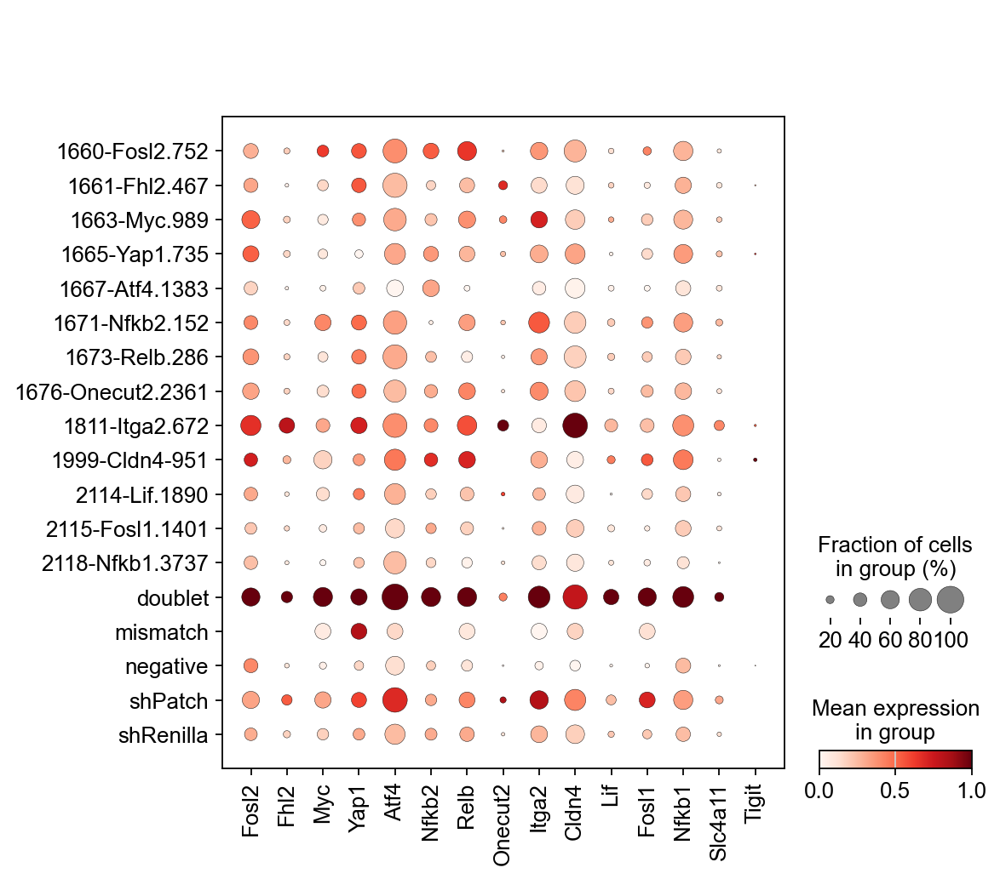

In [76]:
sc.pl.dotplot(adata, targetGenes, groupby='cLibrary', standard_scale='var')

## Set highly variable genes

In [77]:
adata = adata[~(adata.obs['Classification'].isin(['doublet','negative'])|adata.obs['library_id'].isin(['doublet'])),:]

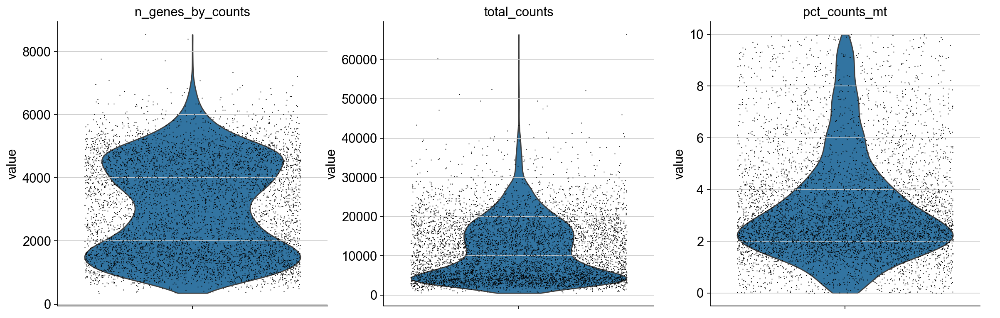

In [78]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

In [79]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:

In [80]:
sc.pp.log1p(adata)

In [81]:
sc.pp.highly_variable_genes(adata) #batch_key=Classification

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


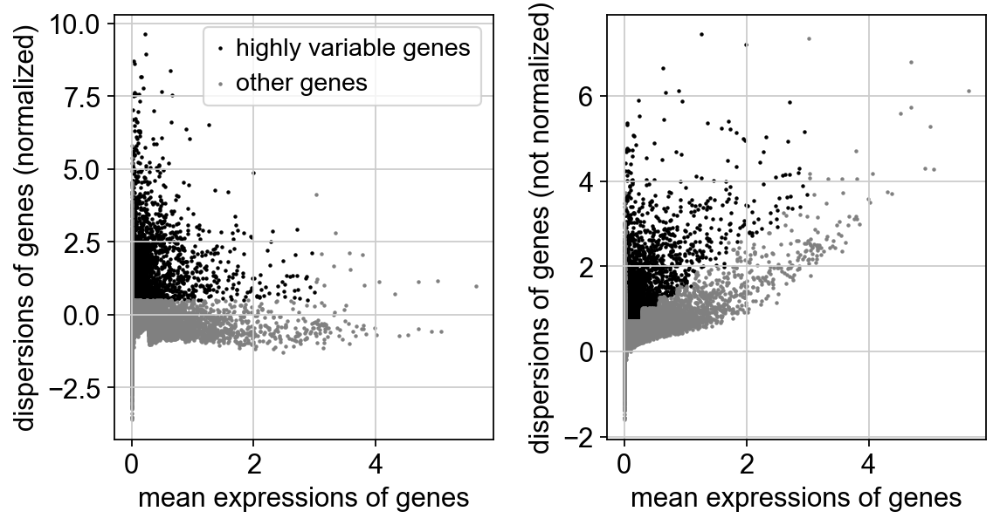

In [82]:
sc.pl.highly_variable_genes(adata)

In [83]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2494002

In [84]:
adata.obs['cLibrary'].value_counts()

cLibrary
negative             5093
shRenilla             211
1676-Onecut2.2361     124
2115-Fosl1.1401        93
1673-Relb.286          88
2114-Lif.1890          71
2118-Nfkb1.3737        71
1671-Nfkb2.152         54
1660-Fosl2.752         51
shPatch                50
1661-Fhl2.467          46
1663-Myc.989           43
1665-Yap1.735          36
1811-Itga2.672         24
doublet                15
1667-Atf4.1383         15
1999-Cldn4-951         11
mismatch                2
Name: count, dtype: int64

In [85]:
#Set shRNA groups
adata.obs['shRNA'] = None
for x in adata.obs["library_id"].cat.categories:
    if x == 'negative':continue
    adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2310838860.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x
/var/folders/xc/wjwqs2j55dqgp2ghrn6n

In [86]:
adata.obs[['Classification','shRNA']].value_counts()

Classification  shRNA                    
AN1973_B0301    shRenilla-library            102
AN1640_B0306    2118-Nfkb1.3737-library       65
AM1153_B0304    1676-Onecut2.2361-library     46
                shRenilla-library             36
AM1818_B0303    shRenilla-library             35
                                            ... 
AN1653_B0305    2114-Lif.1890-library          1
                1999-Cldn4-951-library         1
                1661-Fhl2.467-library          1
AM1818_B0303    1999-Cldn4-951-library         1
AM1153_B0304    1660-Fosl2.752-library         1
Name: count, Length: 67, dtype: int64

In [87]:
sum(adata.obs[['Classification','shRNA']].value_counts())

812

In [88]:
adata.raw = adata

In [89]:
adata.write('write/allmice-noSCT.h5ad', compression='gzip')

In [90]:
adata = adata[:, adata.var.highly_variable]

In [91]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:13)


In [92]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [93]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)


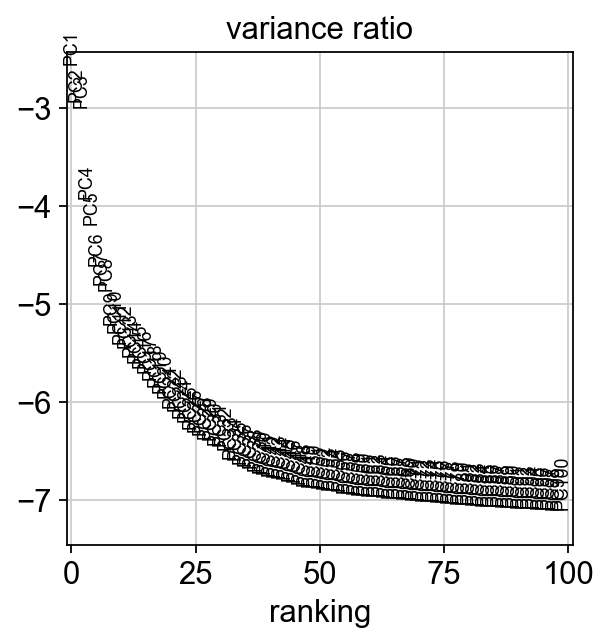

In [94]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

Save the result.

In [95]:
adata.write(results_file, compression='gzip')

In [96]:
adata

AnnData object with n_obs × n_vars = 6098 × 3223
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [97]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


## Embedding the neighborhood graph

In [98]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


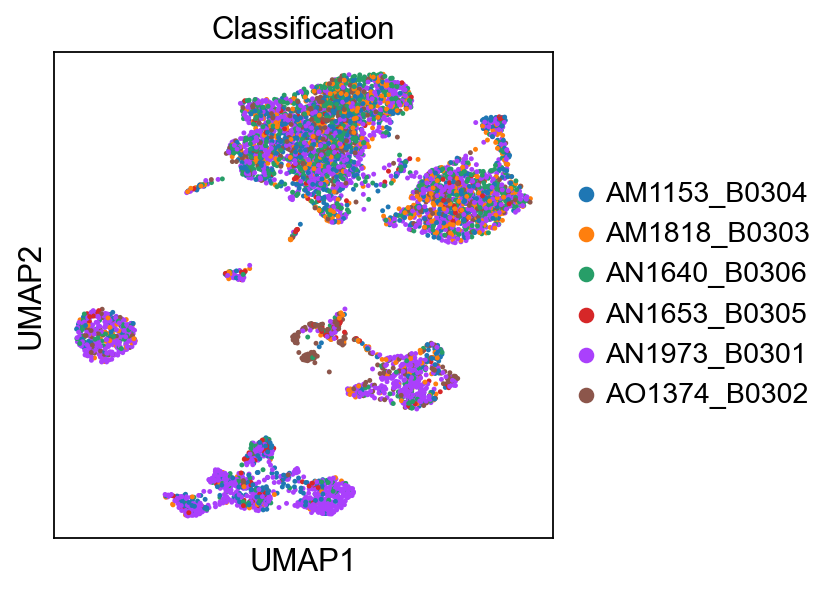

In [99]:
sc.pl.umap(adata, color=['Classification'])

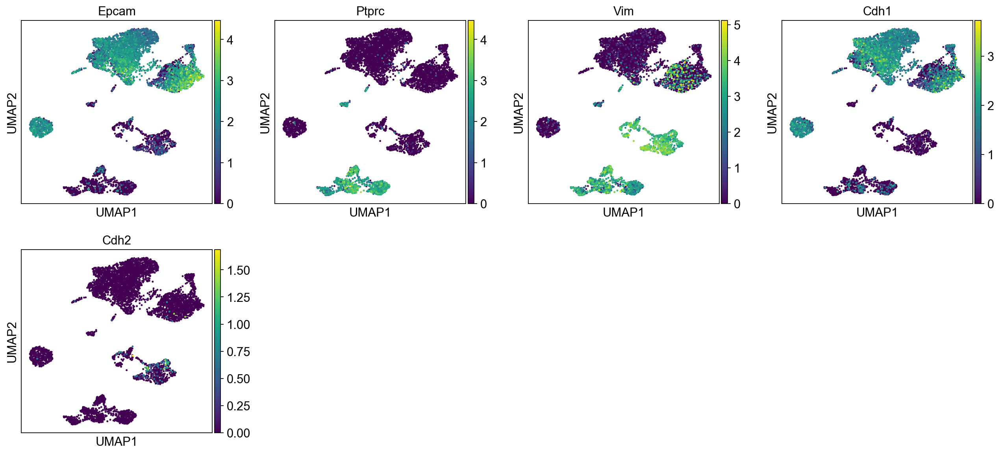

In [100]:
sc.pl.umap(adata, color=['Epcam', 'Ptprc','Vim', 'Cdh1','Cdh2'])

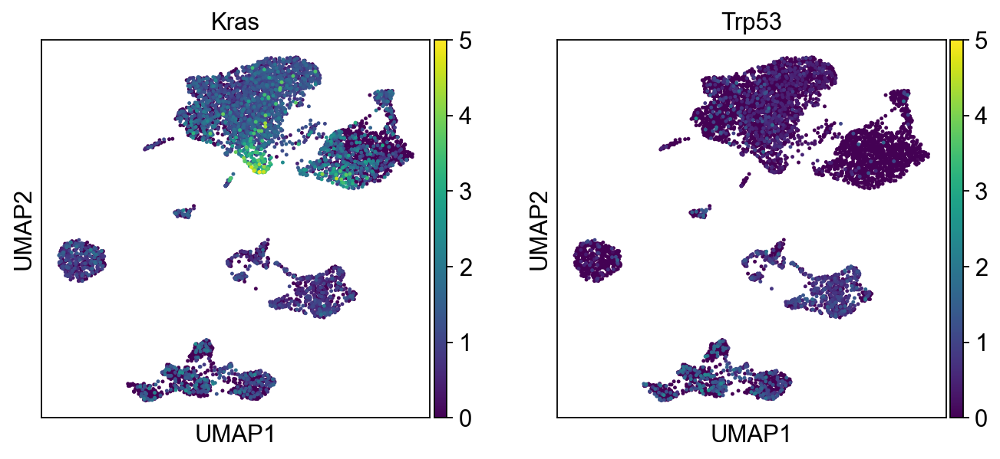

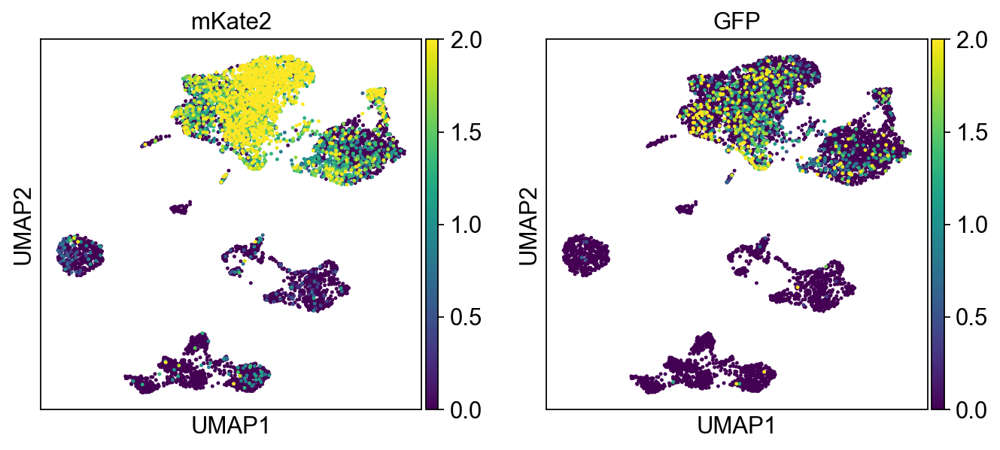

In [101]:
sc.pl.umap(adata, color=['Kras','Trp53'], vmax=5)
sc.pl.umap(adata, color=['mKate2','GFP'], vmax=2)

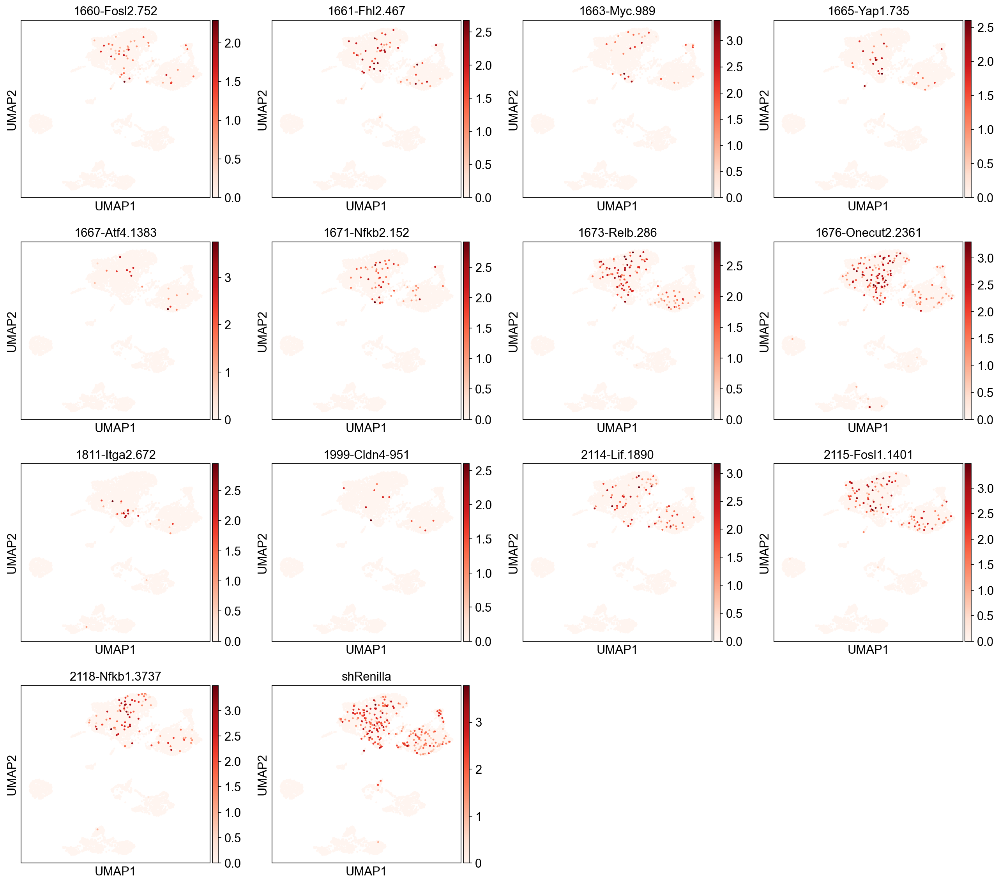

In [102]:
sc.pl.umap(adata, color=library, cmap='Reds')

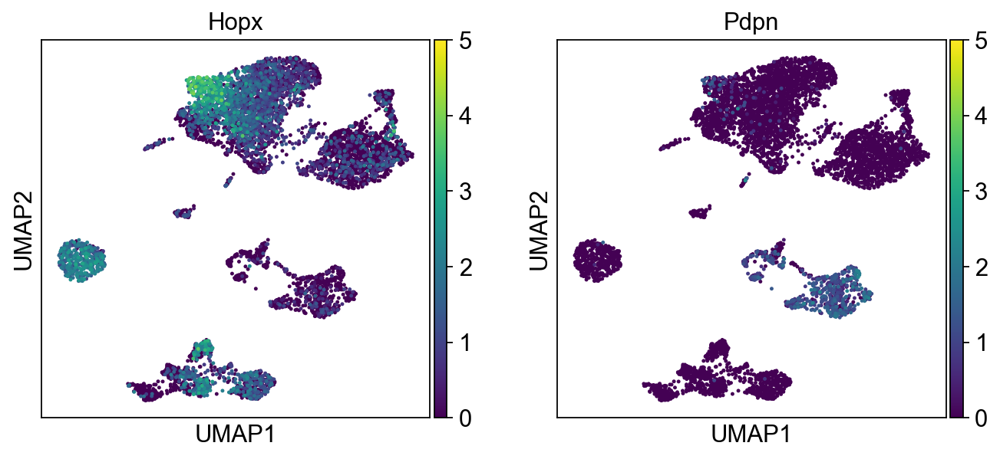

In [103]:
sc.pl.umap(adata, color=['Hopx','Pdpn'], vmax=5)

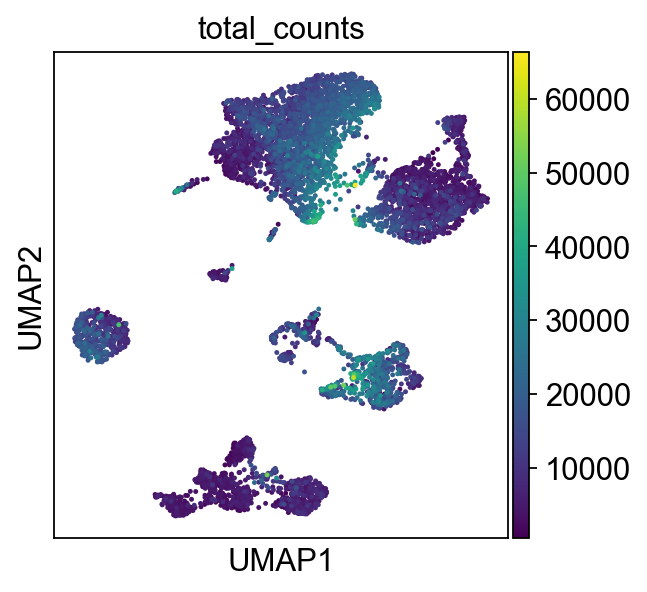

In [104]:
sc.pl.umap(adata, color=['total_counts'])

## Clustering the neighborhood graph

In [105]:
#sc.tl.leiden(adata, resolution=0.30)
sc.tl.leiden(adata, resolution=0.25)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


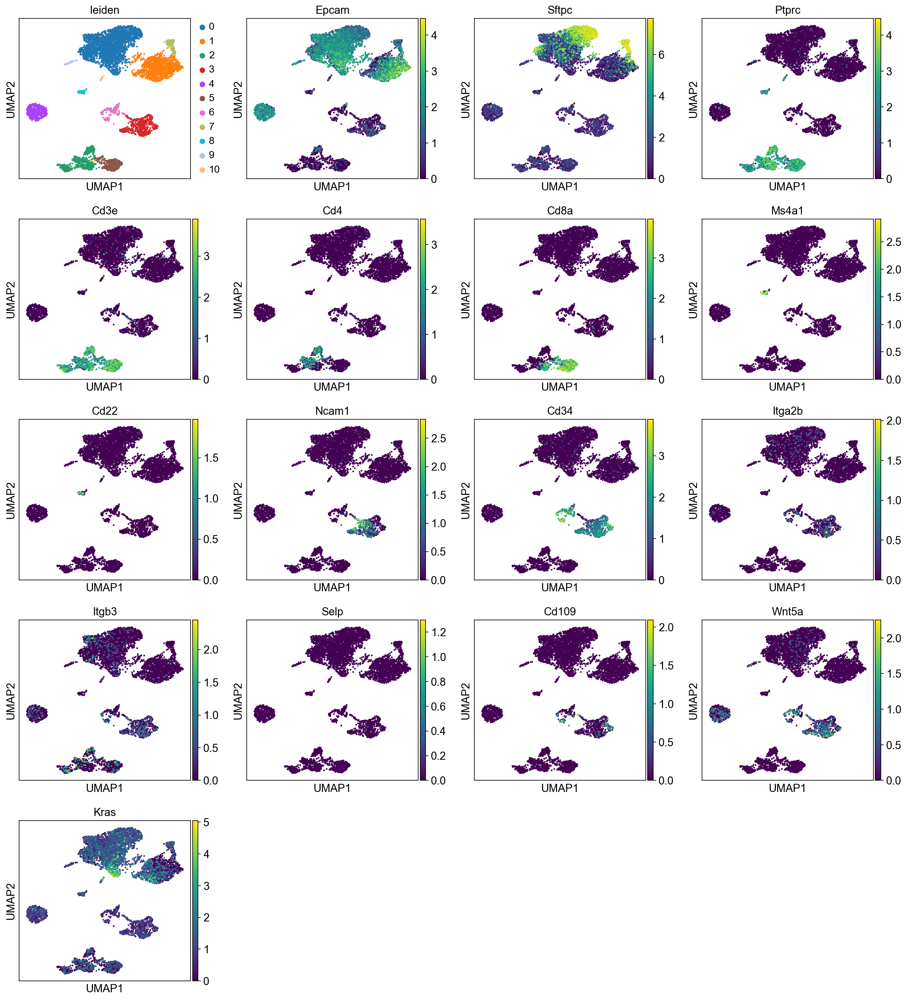

In [106]:
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sftpc', # Tumor cells
                         'Ptprc', #immune
                         'Cd3e', 'Cd4', 'Cd8a', #T cell
                          'Ms4a1', 'Cd22', # B cell 'Cd19',
                         #'Itgax', 'Il3ra', # Dendritic Cell
                         'Ncam1',# 'Ncr1', # NK Cell
                         'Cd34', # Hematopoetic stem cell
                         #'Cd14', 'Cd33', # macrophage
                         #'Ceacam8' # Granulocyte
                         'Itga2b', 'Itgb3', 'Selp', #platelet
                         #'Gypa',  # erythrocyte
                         #'Mcam', 'Vcam1', 'Pecam1', 'Sele', # endothelial cell
                         'Cd109', 'Wnt5a', 'Kras'])

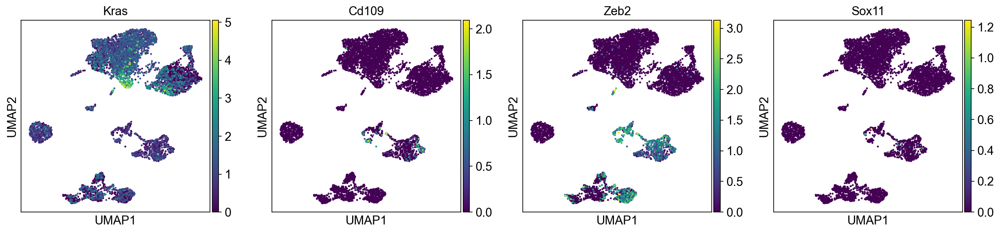

In [107]:
sc.pl.umap(adata, color=['Kras', 'Cd109', 'Zeb2', 'Sox11'])

Save the result.

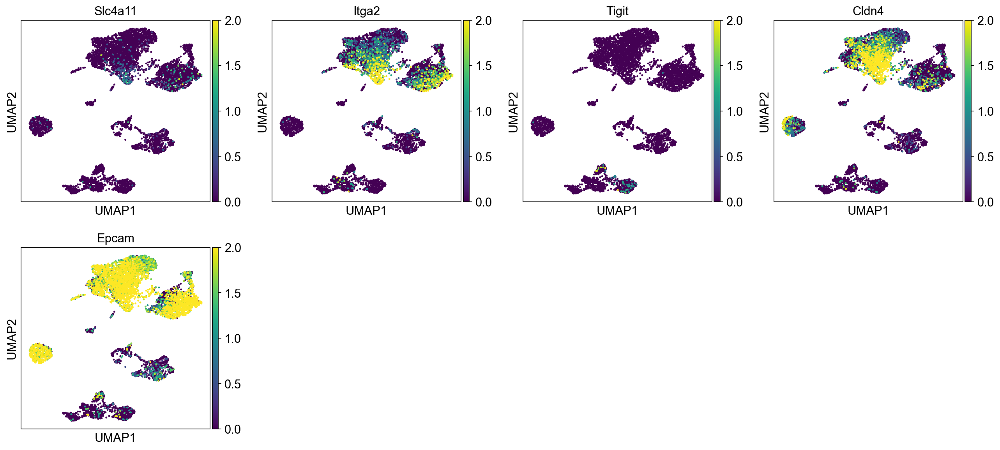

In [108]:
sc.pl.umap(adata, color=['Slc4a11', 'Itga2', 'Tigit', 'Cldn4','Epcam'], vmax=2)

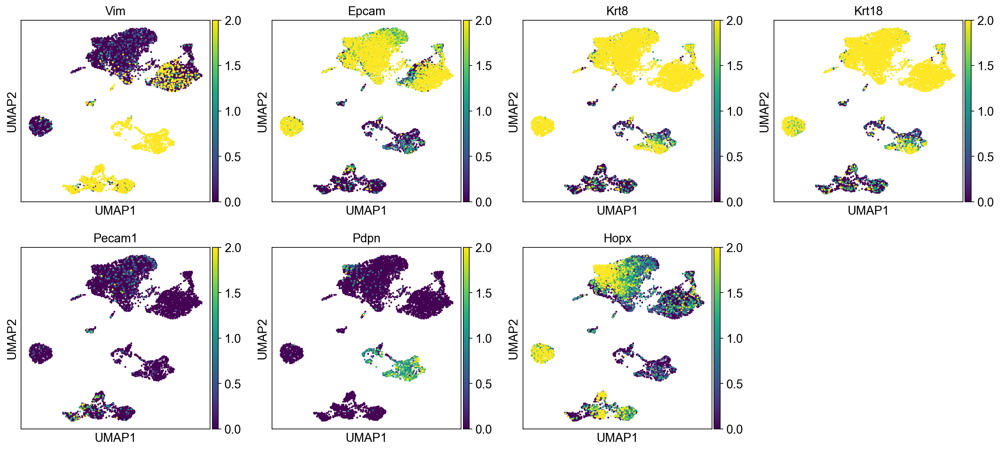

In [109]:
sc.pl.umap(adata, color=['Vim', 'Epcam', 'Krt8', 'Krt18','Pecam1', 'Pdpn', 'Hopx'], vmax=2)

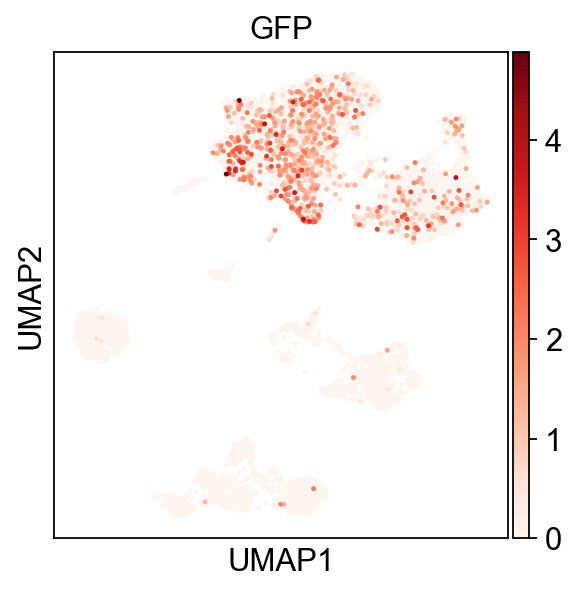

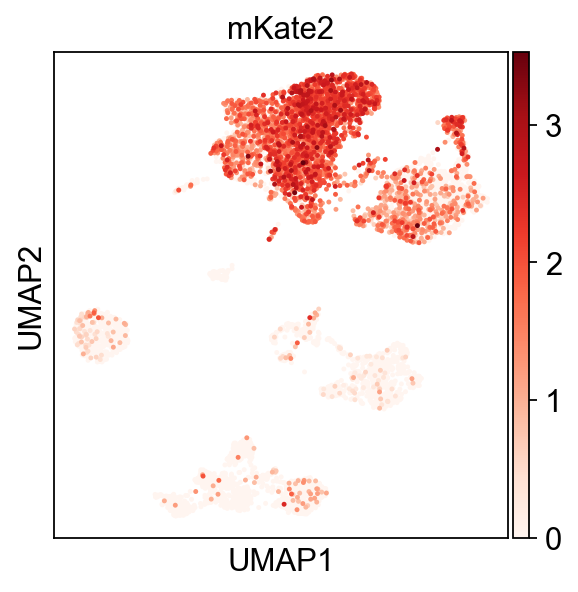

In [110]:
sc.pl.umap(adata, color=['GFP'], cmap='Reds')
sc.pl.umap(adata, color=['mKate2'], cmap='Reds')

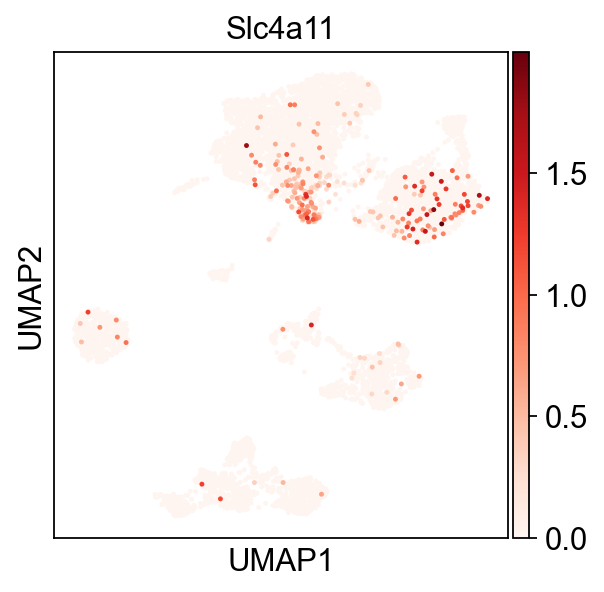

In [111]:
sc.pl.umap(adata, color=['Slc4a11'], cmap='Reds')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


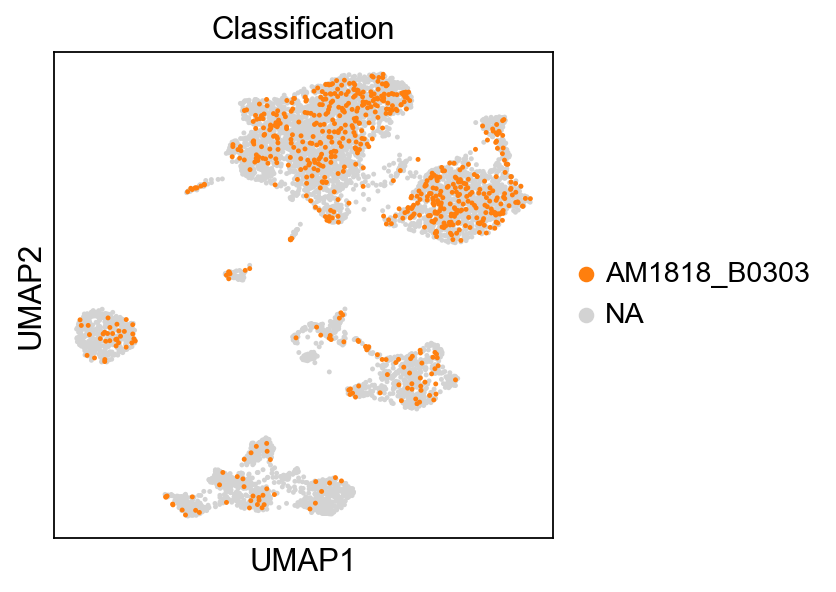

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


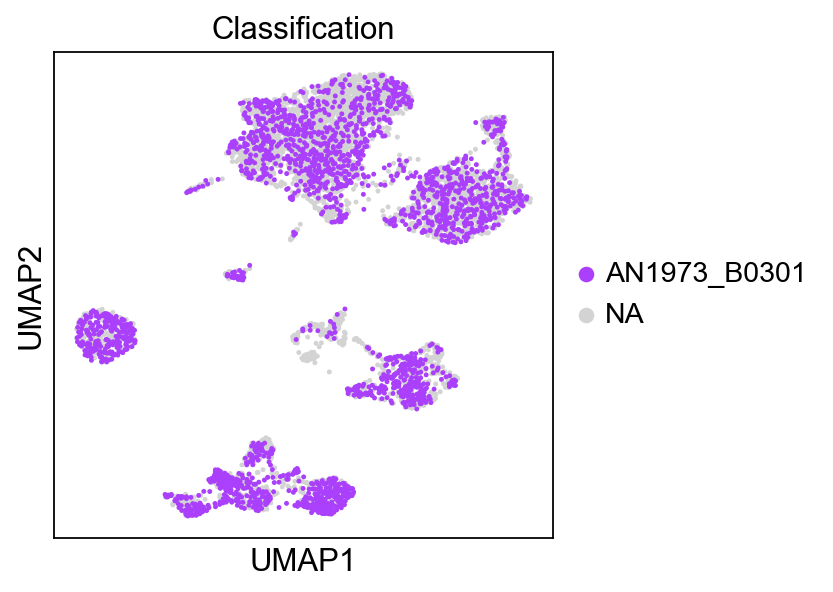

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


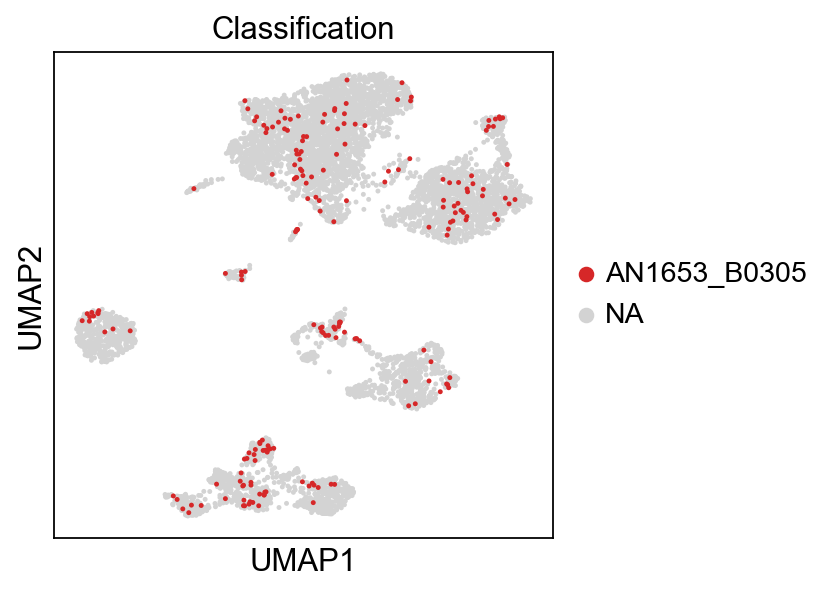

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


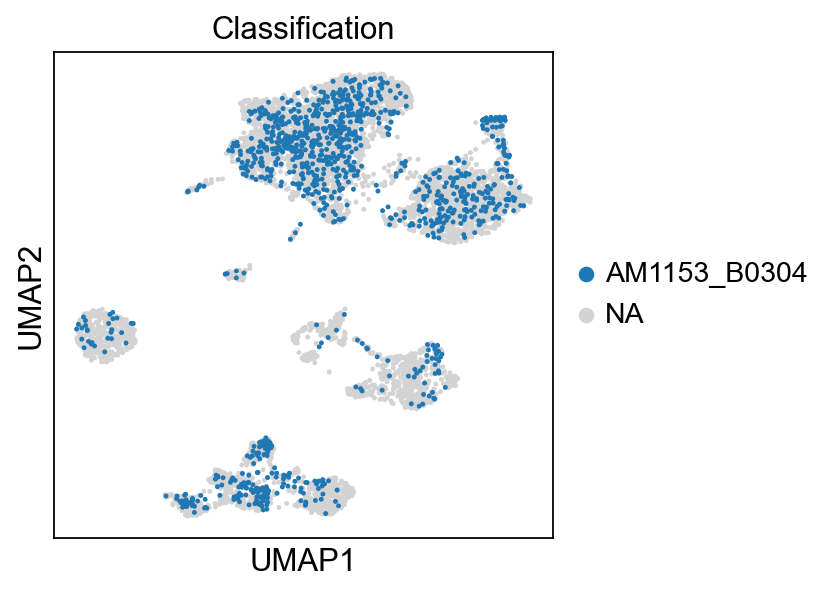

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


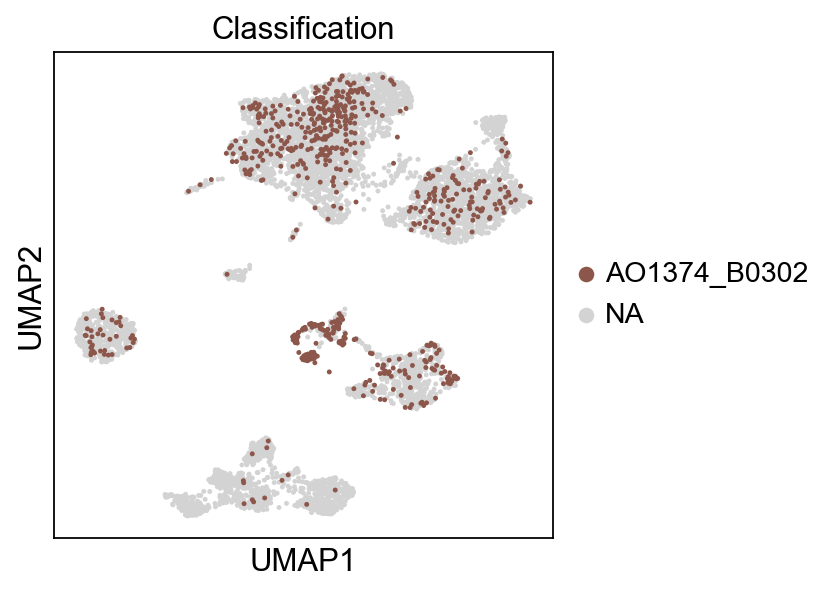

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


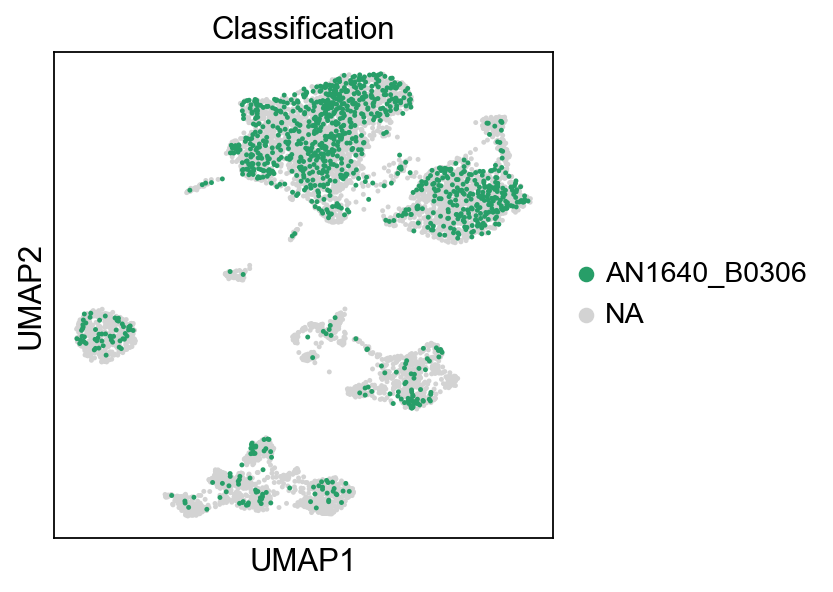

In [112]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [113]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

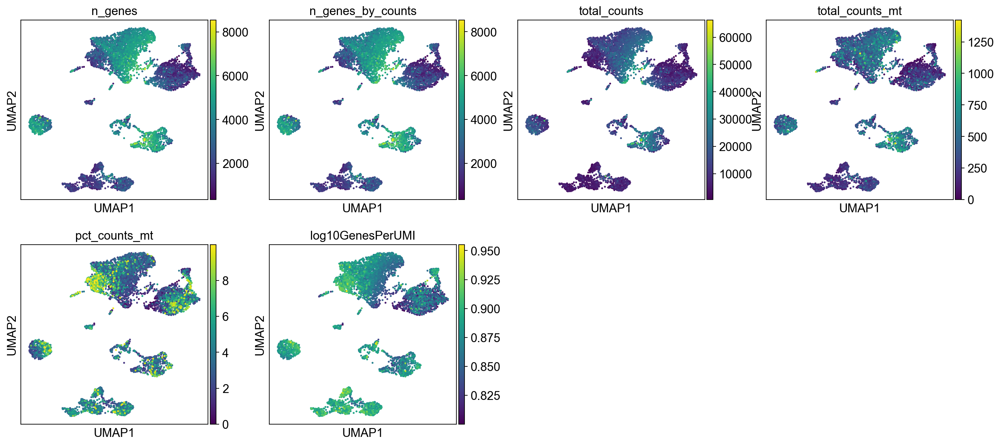

In [114]:
sc.pl.umap(adata,color=['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI'])

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


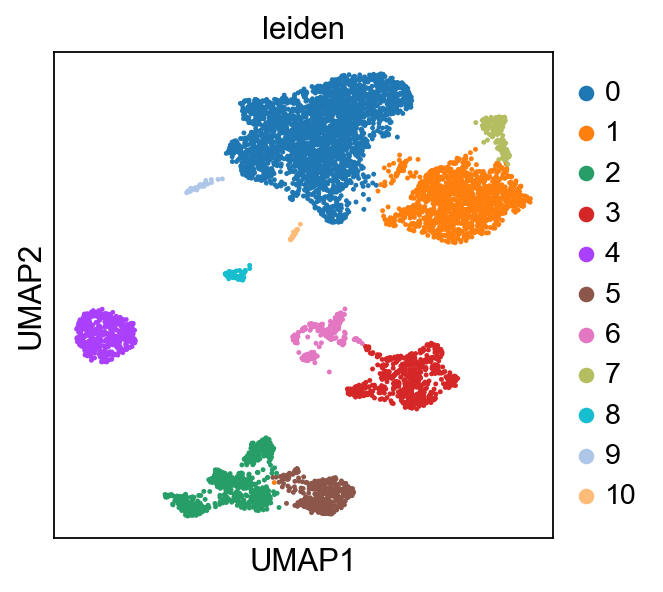

In [115]:
sc.pl.umap(adata,color='leiden')

In [116]:
adata[adata.obs.leiden.isin(['0','1','7']),:]

View of AnnData object with n_obs × n_vars = 4007 × 3223
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    ob

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


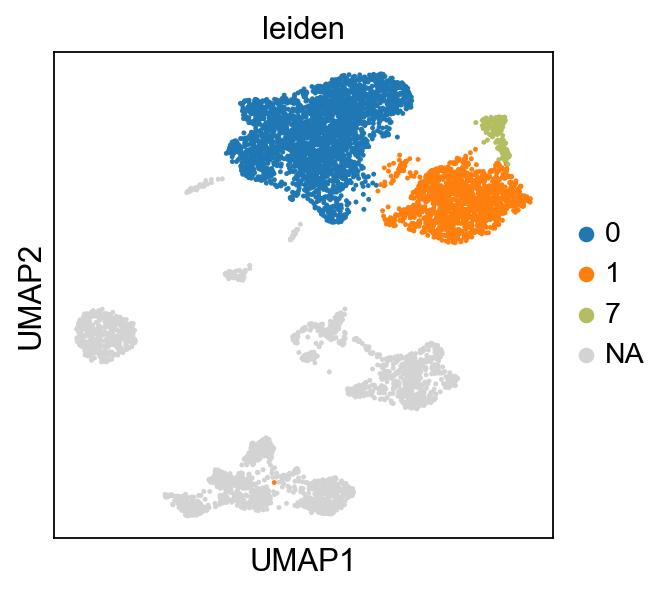

In [117]:
sc.pl.umap(adata, color=['leiden'], groups=['0','1','7']) # cluster 3 seems to be fibroblasts

## Save Tumor Cells

In [118]:
# Select only those subset of cells that are useful
adata2 = sc.read('write/allmice-noSCT.h5ad')
adata = adata2[adata.obs['leiden'].isin(['0','1','7']),:] # remove fibroblast cells
del adata2

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [119]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [120]:
sc.pp.highly_variable_genes(adata)#, batch_key='Classification')

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [121]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_30853/2494002

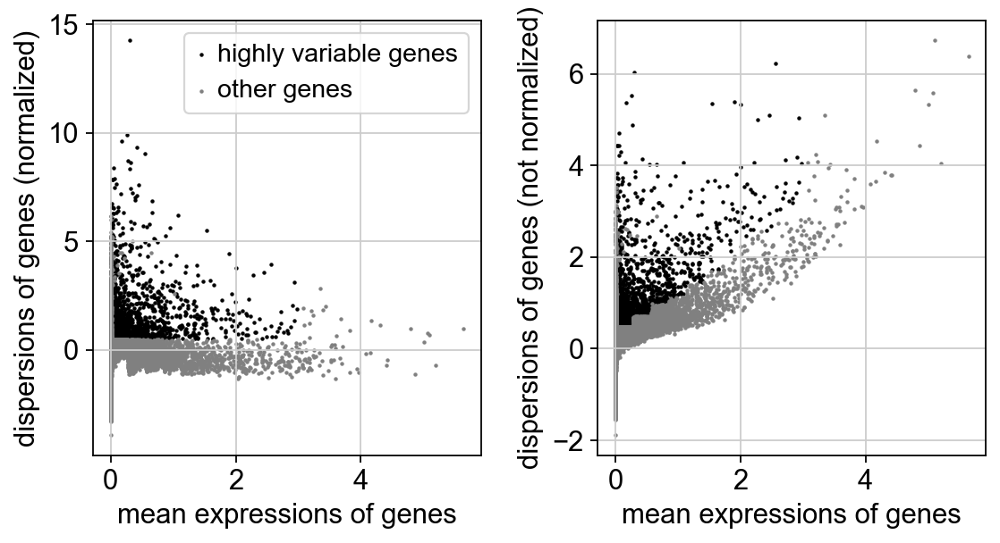

In [122]:
sc.pl.highly_variable_genes(adata)

In [123]:
adata.raw = adata

In [124]:
adata.write('write/allmice-tumornoSCT.h5ad', compression='gzip')
#adata = sc.read('write/allmice-tumornoSCT.h5ad')